In [ ]:
# Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import IsolationForest
from statsmodels.tsa.arima.model import ARIMA
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')

In [2]:
demo_df = pd.read_csv("demo_df.csv")

In [3]:
demo_df.head()

,date,state,district,pincode,demo_age_5_17,demo_age_17_,month,month_name
0,2025-03-01,Uttar Pradesh,Gorakhpur,273213,49,529,3,March
1,2025-03-01,Andhra Pradesh,Chittoor,517132,22,375,3,March
2,2025-03-01,Gujarat,Rajkot,360006,65,765,3,March
3,2025-03-01,Andhra Pradesh,Srikakulam,532484,24,314,3,March
4,2025-03-01,Rajasthan,Udaipur,313801,45,785,3,March


In [4]:
demo_df.shape

(2071698, 8)

In [5]:
demo_df.columns

Index(['date', 'state', 'district', 'pincode', 'demo_age_5_17', 'demo_age_17_',
       'month', 'month_name'],
      dtype='object')

In [6]:
len(demo_df['state'].unique())

36

In [7]:
len(demo_df.state.value_counts())

36

In [8]:
for state in sorted(demo_df['state'].unique()):
    districts = demo_df[demo_df['state'] == state]['district'].unique()
    print(f"{state}: {sorted(districts)}")

Andaman And Nicobar Islands: ['Nicobar', 'North And Middle Andaman', 'South Andaman']
Andhra Pradesh: ['Alluri Sitharama Raju', 'Anakapalli', 'Anantapur', 'Annamayya', 'Bapatla', 'Chittoor', 'Dr. B.R. Ambedkar Konaseema', 'East Godavari', 'Eluru', 'Guntur', 'Kakinada', 'Krishna', 'Kurnool', 'Nandyal', 'Ntr', 'Palnadu', 'Parvathipuram Manyam', 'Prakasam', 'Ranga Reddy', 'Sri Potti Sriramulu Nellore', 'Sri Sathya Sai', 'Srikakulam', 'Tirupati', 'Visakhapatnam', 'Vizianagaram', 'West Godavari', 'Ysr Kadapa']
Arunachal Pradesh: ['Anjaw', 'Changlang', 'Dibang Valley', 'East Kameng', 'East Siang', 'Kamle', 'Kra Daadi', 'Kurung Kumey', 'Leparada', 'Lohit', 'Longding', 'Lower Dibang Valley', 'Lower Siang', 'Lower Subansiri', 'Namsai', 'Pakke Kessang', 'Papum Pare', 'Shi Yomi', 'Siang', 'Tawang', 'Tirap', 'Upper Siang', 'Upper Subansiri', 'West Kameng', 'West Siang']
Assam: ['Bajali', 'Baksa', 'Barpeta', 'Biswanath', 'Bongaigaon', 'Cachar', 'Charaideo', 'Chirang', 'Darrang', 'Dhemaji', 'Dhubri'

In [9]:
demo_df.month_name.value_counts()

month_name
December     657607
November     566826
September    449761
October      374116
March         18418
July           1376
May            1374
June           1117
April          1103
Name: count, dtype: int64

In [10]:
# View duplicate rows in demo_df
duplicate_rows = demo_df[demo_df.duplicated()]
duplicate_rows

,date,state,district,pincode,demo_age_5_17,demo_age_17_,month,month_name
4206,2025-09-01,Karnataka,Belagavi,591240,0,2,9,September
4444,2025-09-01,Karnataka,Shivamogga,577418,0,1,9,September
4465,2025-09-01,Karnataka,Tumakuru,572116,0,3,9,September
6366,2025-09-01,Odisha,Jajpur,755050,0,1,9,September
8229,2025-09-02,Andhra Pradesh,Anantapur,515211,0,2,9,September
...,...,...,...,...,...,...,...,...
2070975,2025-12-29,Uttar Pradesh,Ayodhya,224172,0,6,12,December
2071327,2025-12-29,West Bengal,Purba Bardhaman,712134,0,1,12,December
2071365,2025-12-29,West Bengal,Purba Bardhaman,713369,0,1,12,December
2071403,2025-12-29,West Bengal,Purba Medinipur,721428,0,1,12,December


Karnataka	Belagavi	591240	0	2	9	September

In [12]:
# Filtering the dataframe for the specific row
target_row = demo_df[
    (demo_df['state'] == 'Karnataka') & 
    (demo_df['district'] == 'Belagavi') & 
    (demo_df['pincode'] == 591240) & 
    (demo_df['demo_age_5_17'] == 0) & 
    (demo_df['demo_age_17_'] == 2) &
    (demo_df['month_name'] == 'September')
]

# Display the result
print(target_row)

               date      state  district  pincode  demo_age_5_17  \
4193     2025-09-01  Karnataka  Belagavi   591240              0   
4206     2025-09-01  Karnataka  Belagavi   591240              0   
18458    2025-09-04  Karnataka  Belagavi   591240              0   
26051    2025-09-06  Karnataka  Belagavi   591240              0   
83767    2025-09-18  Karnataka  Belagavi   591240              0   
838457   2025-09-02  Karnataka  Belagavi   591240              0   
1328546  2025-09-18  Karnataka  Belagavi   591240              0   

         demo_age_17_  month month_name  
4193                2      9  September  
4206                2      9  September  
18458               2      9  September  
26051               2      9  September  
83767               2      9  September  
838457              2      9  September  
1328546             2      9  September  


The month with the most Demographic updates is March with 11147558 updates.


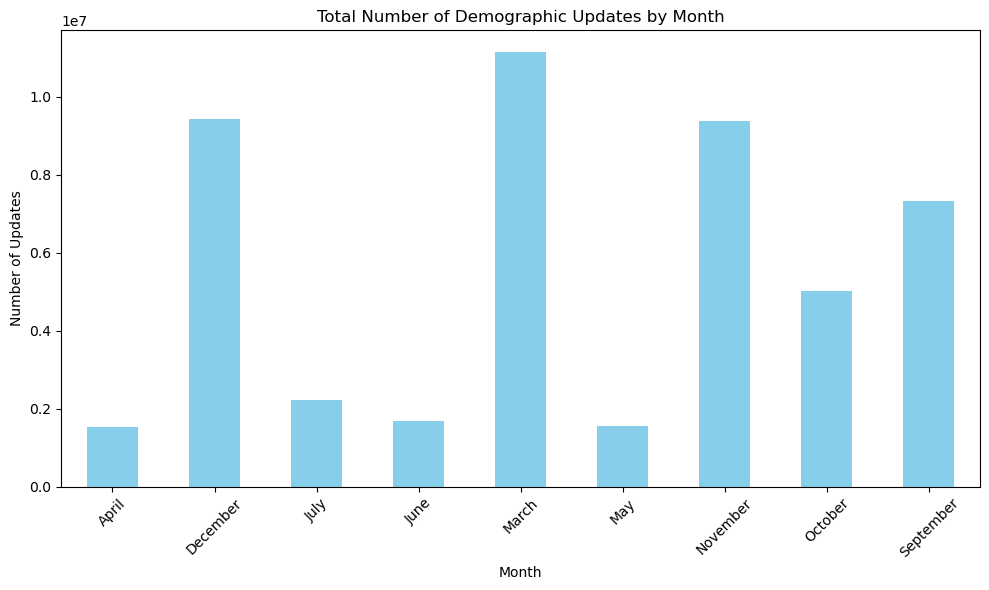

In [13]:
# Analyze monthly demographic updates
monthly_updates = demo_df.groupby('month_name')[['demo_age_5_17', 'demo_age_17_']].sum().sum(axis=1).sort_index()

# Find the month with the most updates
most_updates_month = monthly_updates.idxmax()
most_updates_count = monthly_updates.max()

print(f"The month with the most Demographic updates is {most_updates_month} with {most_updates_count} updates.")

# Visualize the monthly updates
plt.figure(figsize=(10, 6))
monthly_updates.plot(kind='bar', color='skyblue')
plt.title('Total Number of Demographic Updates by Month')
plt.xlabel('Month')
plt.ylabel('Number of Updates')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [14]:
# Overall demographic update by month
overall_enrollments = demo_df.groupby('month_name')[['demo_age_5_17', 'demo_age_17_']].sum().sum(axis=1).reset_index()
overall_enrollments.columns = ['month_name', 'total_demographic_updates']

# Sort by month order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
overall_enrollments['month_name'] = pd.Categorical(overall_enrollments['month_name'], categories=month_order, ordered=True)
overall_enrollments = overall_enrollments.sort_values('month_name')

# Line plot
fig = px.line(overall_enrollments, x='month_name', y='total_demographic_updates', 
              title='Overall demographic update by Month',
              labels={'month_name': 'Month', 'total_demographic_updates': 'Total Demographic Updates'})
fig.update_layout(xaxis_title='Month', yaxis_title='Total Demographic Updates')
fig.show()

Monthly sums for age groups:
            demo_age_5_17  demo_age_17_
month_name                             
April              198744       1316928
December           926183       8510581
July               288449       1932266
June               197767       1487795
March              976095      10171463
May                204893       1361394
November           821273       8566328
October            479232       4531734
September          770788       6553272


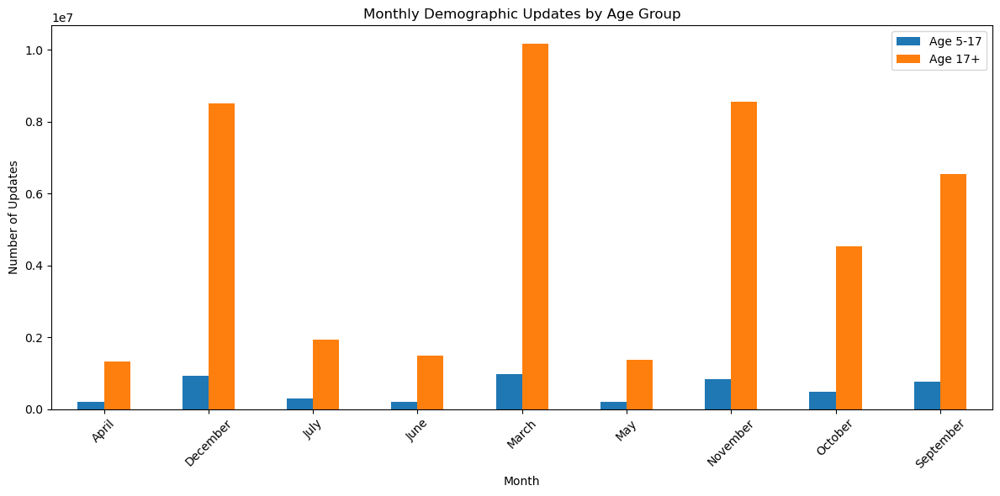

In [15]:
# Group by month and sum the age groups
monthly_age_groups = demo_df.groupby('month_name')[['demo_age_5_17', 'demo_age_17_']].sum().sort_index()

print("Monthly sums for age groups:")
print(monthly_age_groups)

# Visualize
monthly_age_groups.plot(kind='bar', figsize=(12, 6))
plt.title('Monthly Demographic Updates by Age Group')
plt.xlabel('Month')
plt.ylabel('Number of Updates')
plt.legend(['Age 5-17', 'Age 17+'])
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

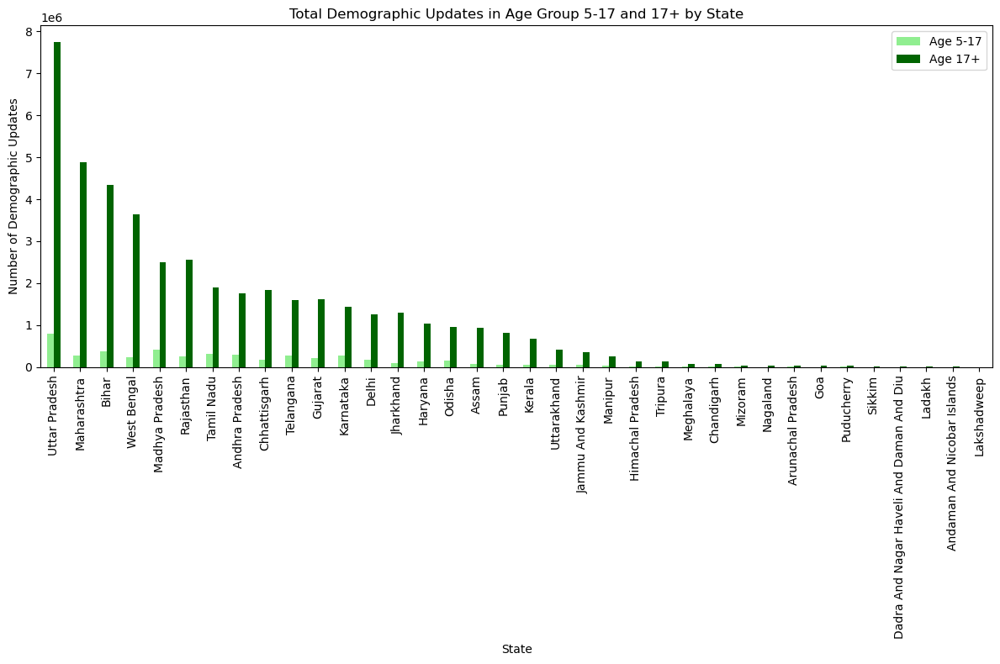

In [ ]:
# 1. Aggregate
age_by_state = demo_df.groupby('state')[['demo_age_5_17', 'demo_age_17_']].sum()

# 2. Sort by the sum of both columns
age_by_state = age_by_state.assign(total=age_by_state.sum(axis=1)).sort_values(by='total', ascending=False).drop(columns='total')

# 3. Plot (using two colors to distinguish the groups)
plt.figure(figsize=(12, 8))
age_by_state.plot(kind='bar', color=['lightgreen', 'darkgreen'], ax=plt.gca()) # ax=plt.gca() keeps it in the figure
plt.title('Total Demographic Updates in Age Group 5-17 and 17+ by State')
plt.xlabel('State')
plt.ylabel('Number of Demographic Updates')
plt.xticks(rotation=90)
plt.legend(["Age 5-17", "Age 17+"])
plt.tight_layout()
plt.show()

Total Demographic Updates in age group 'demo_age_17_' by state:
state
Uttar Pradesh                               7752020
Maharashtra                                 4876576
Bihar                                       4339034
West Bengal                                 3630176
Rajasthan                                   2560393
Madhya Pradesh                              2505840
Tamil Nadu                                  1896591
Chhattisgarh                                1840231
Andhra Pradesh                              1762407
Gujarat                                     1615853
Telangana                                   1599680
Karnataka                                   1430305
Jharkhand                                   1301813
Delhi                                       1263399
Haryana                                     1026826
Odisha                                       964566
Assam                                        928098
Punjab                                       8

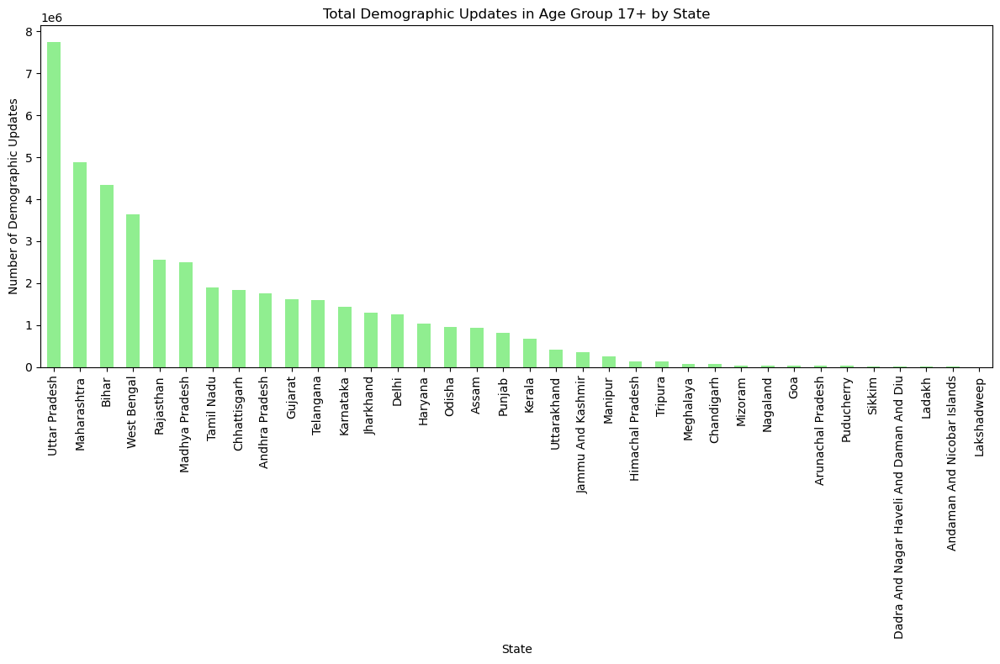

In [18]:
# Analyze enrollments in age group 'age_0_5' by state
age_0_5_by_state = demo_df.groupby('state')['demo_age_17_'].sum().sort_values(ascending=False)[0:]

print("Total Demographic Updates in age group 'demo_age_17_' by state:")
print(age_0_5_by_state)

# Visualize
plt.figure(figsize=(12, 8))
age_0_5_by_state.plot(kind='bar', color='lightgreen')
plt.title('Total Demographic Updates in Age Group 17+ by State')
plt.xlabel('State')
plt.ylabel('Number of Demographic Updates')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

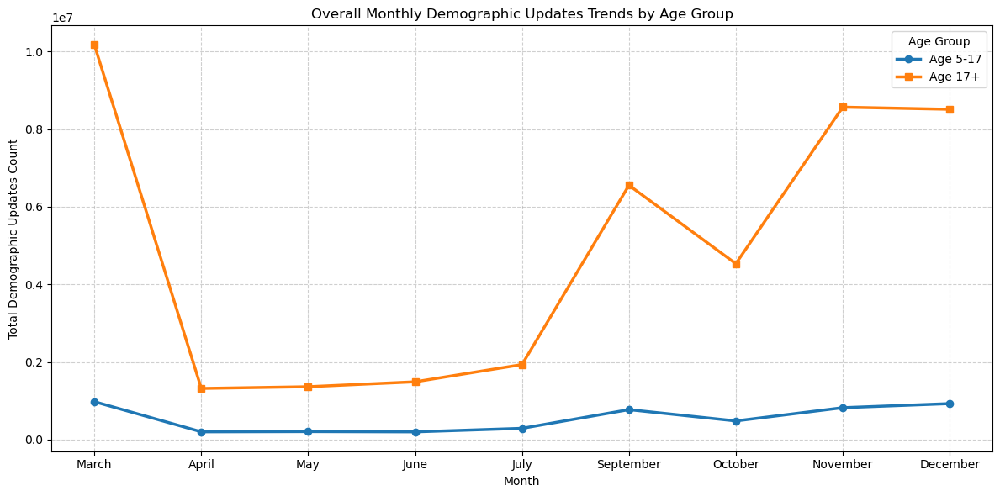

In [19]:
df = pd.read_csv('demo_df.csv')

# Group by month and sum the counts for all age groups
monthly_trends = df.groupby(['month', 'month_name'])[['demo_age_5_17', 'demo_age_17_']].sum().reset_index()

# Sort by month to ensure chronological order
monthly_trends = monthly_trends.sort_values('month')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(monthly_trends['month_name'], monthly_trends['demo_age_5_17'], marker='o', label='Age 5-17', linewidth=2.5)
plt.plot(monthly_trends['month_name'], monthly_trends['demo_age_17_'], marker='s', label='Age 17+', linewidth=2.5)

plt.title('Overall Monthly Demographic Updates Trends by Age Group')
plt.xlabel('Month')
plt.ylabel('Total Demographic Updates Count')
plt.legend(title='Age Group')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

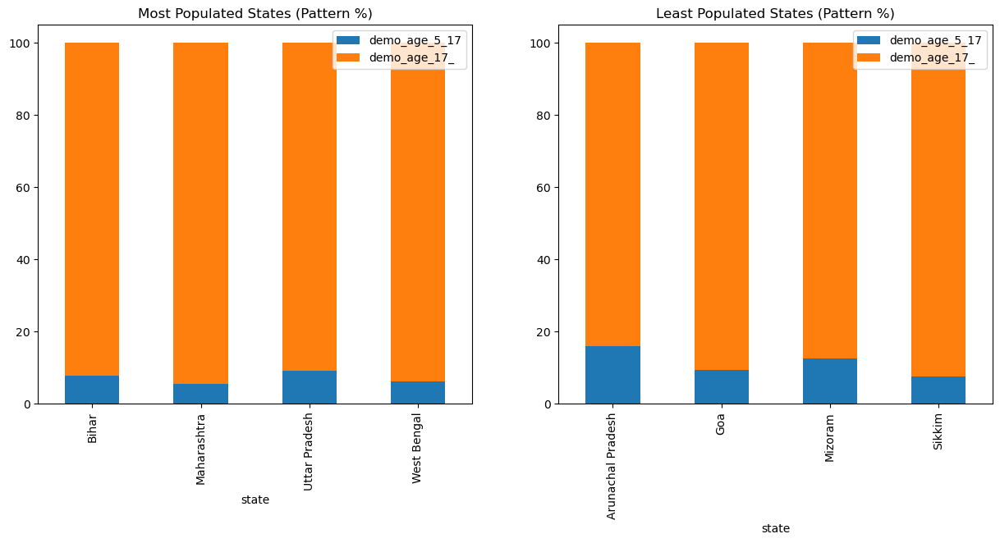

In [20]:
# Defining States based on current (2024/2025) Population Rankings
most_populated = ['Uttar Pradesh', 'Bihar', 'Maharashtra', 'West Bengal']
least_populated = ['Sikkim', 'Mizoram', 'Arunachal Pradesh', 'Goa']

# Aggregating and Calculating Percentages for Patterns
def get_patterns(state_list):
    subset = df[df['state'].isin(state_list)]
    agg = subset.groupby('state')[['demo_age_5_17', 'demo_age_17_']].sum()
    return agg.div(agg.sum(axis=1), axis=0) * 100

most_pop_patterns = get_patterns(most_populated)
least_pop_patterns = get_patterns(least_populated)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
most_pop_patterns.plot(kind='bar', stacked=True, ax=axes[0], title='Most Populated States (Pattern %)')
least_pop_patterns.plot(kind='bar', stacked=True, ax=axes[1], title='Least Populated States (Pattern %)')
plt.show()

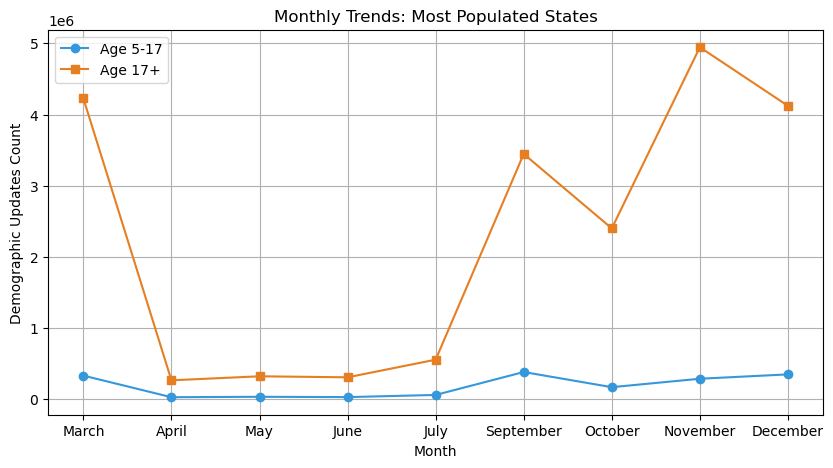

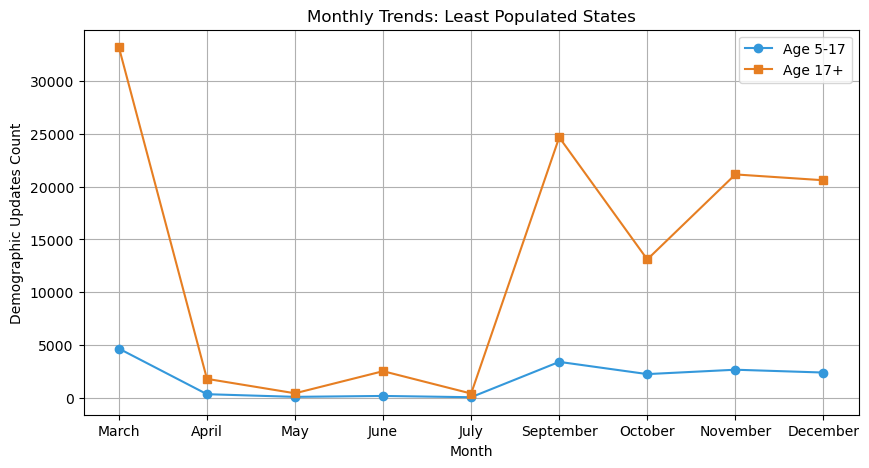

In [21]:
# Define state groups based on current population
most_pop = ['Uttar Pradesh', 'Bihar', 'Maharashtra', 'West Bengal']
least_pop = ['Sikkim', 'Mizoram', 'Arunachal Pradesh', 'Goa']

# Prepare data function
def get_pop_trend(states):
    subset = df[df['state'].isin(states)]
    return subset.groupby(['month', 'month_name'])[['demo_age_5_17', 'demo_age_17_']].sum().reset_index().sort_values('month')

most_pop_trend = get_pop_trend(most_pop)
least_pop_trend = get_pop_trend(least_pop)

# Plotting function
def plot_pop_trend(data, title):
    plt.figure(figsize=(10, 5))
    plt.plot(data['month_name'], data['demo_age_5_17'], marker='o', label='Age 5-17', color='#3498db')
    plt.plot(data['month_name'], data['demo_age_17_'], marker='s', label='Age 17+', color='#e67e22')
    plt.title(title)
    plt.xlabel('Month')
    plt.ylabel('Demographic Updates Count')
    plt.legend()
    plt.grid(True)
    plt.show()

# Visualize
plot_pop_trend(most_pop_trend, 'Monthly Trends: Most Populated States')
plot_pop_trend(least_pop_trend, 'Monthly Trends: Least Populated States')

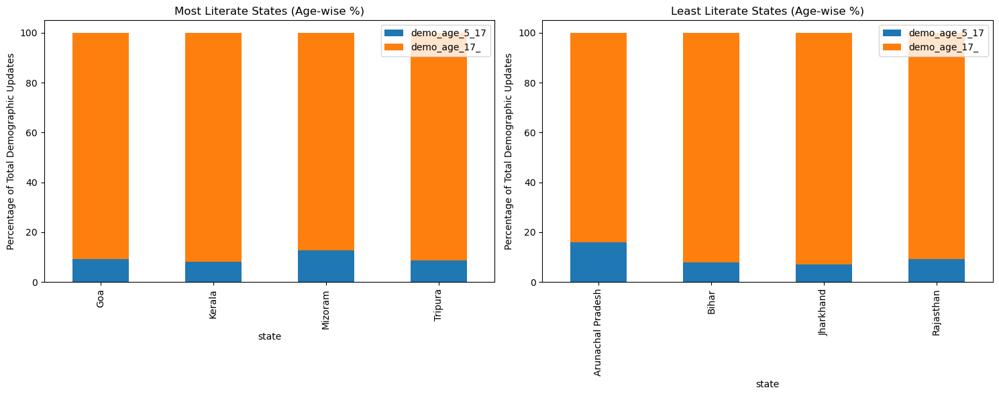

In [22]:
# Define groups based on real-world literacy rankings
most_literate = ['Kerala', 'Mizoram', 'Goa', 'Tripura']
least_literate = ['Bihar', 'Arunachal Pradesh', 'Rajasthan', 'Jharkhand']

# Function to extract age-wise distribution percentage
def get_literacy_patterns(state_list):
    subset = df[df['state'].isin(state_list)]
    agg = subset.groupby('state')[['demo_age_5_17', 'demo_age_17_']].sum()
    # Convert to percentage for relative pattern analysis
    return agg.div(agg.sum(axis=1), axis=0) * 100

most_lit_pct = get_literacy_patterns(most_literate)
least_lit_pct = get_literacy_patterns(least_literate)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

most_lit_pct.plot(kind='bar', stacked=True, ax=axes[0], title='Most Literate States (Age-wise %)')
axes[0].set_ylabel('Percentage of Total Demographic Updates')

least_lit_pct.plot(kind='bar', stacked=True, ax=axes[1], title='Least Literate States (Age-wise %)')
axes[1].set_ylabel('Percentage of Total Demographic Updates')

plt.tight_layout()
plt.show()

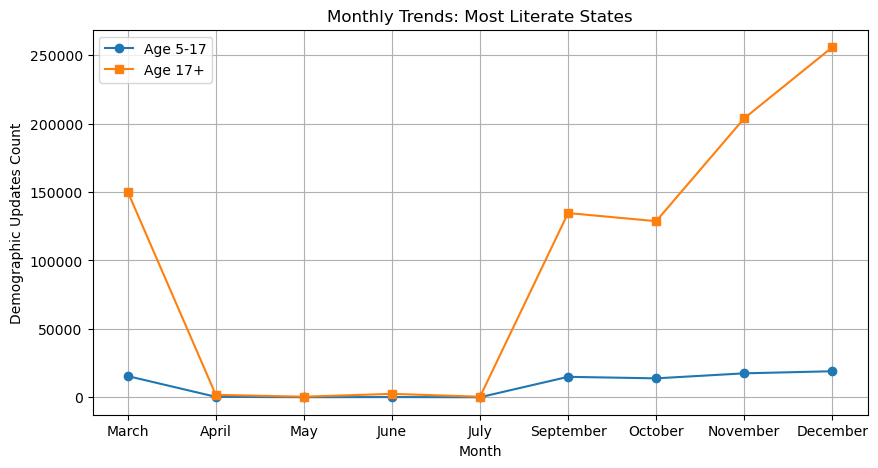

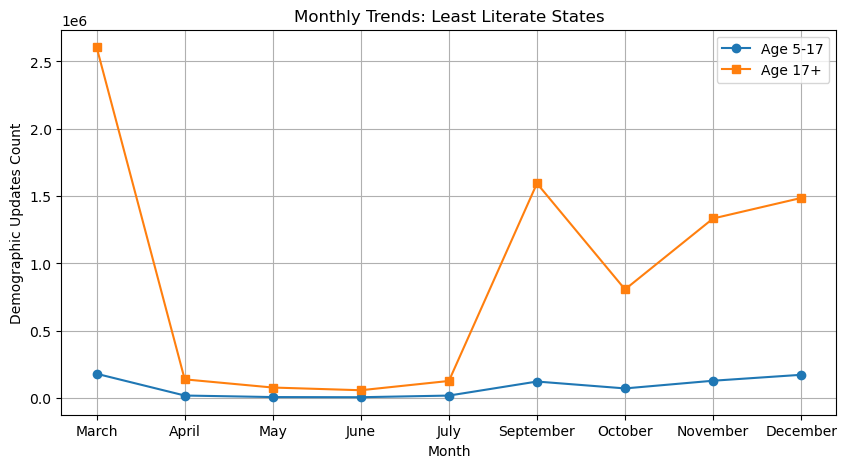

In [23]:
# Define state groups
most_lit = ['Kerala', 'Mizoram', 'Goa', 'Tripura']
least_lit = ['Bihar', 'Arunachal Pradesh', 'Rajasthan', 'Jharkhand']

# Prepare data function
def get_trend(states):
    subset = df[df['state'].isin(states)]
    return subset.groupby(['month', 'month_name'])[['demo_age_5_17', 'demo_age_17_']].sum().reset_index().sort_values('month')

most_trend = get_trend(most_lit)
least_trend = get_trend(least_lit)

# Plotting Function
def plot_trend(data, title):
    plt.figure(figsize=(10, 5))
    plt.plot(data['month_name'], data['demo_age_5_17'], marker='o', label='Age 5-17')
    plt.plot(data['month_name'], data['demo_age_17_'], marker='s', label='Age 17+')
    plt.title(title)
    plt.xlabel('Month')
    plt.ylabel('Demographic Updates Count')
    plt.legend()
    plt.grid(True)
    plt.show()

# Generate Plots
plot_trend(most_trend, 'Monthly Trends: Most Literate States')
plot_trend(least_trend, 'Monthly Trends: Least Literate States')

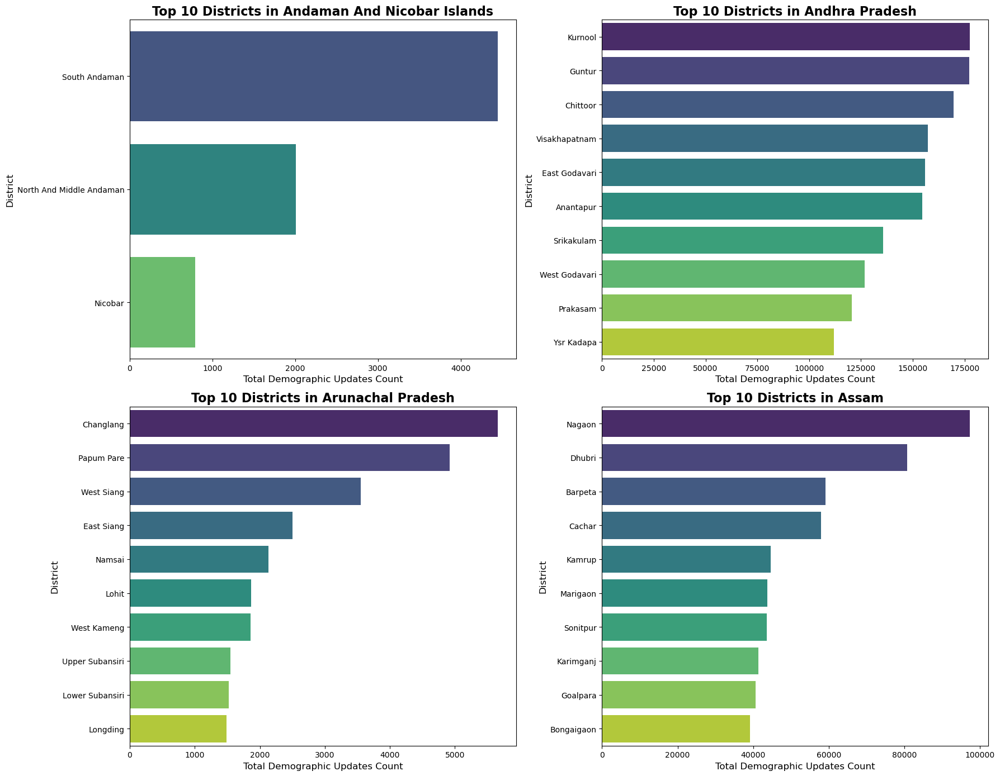

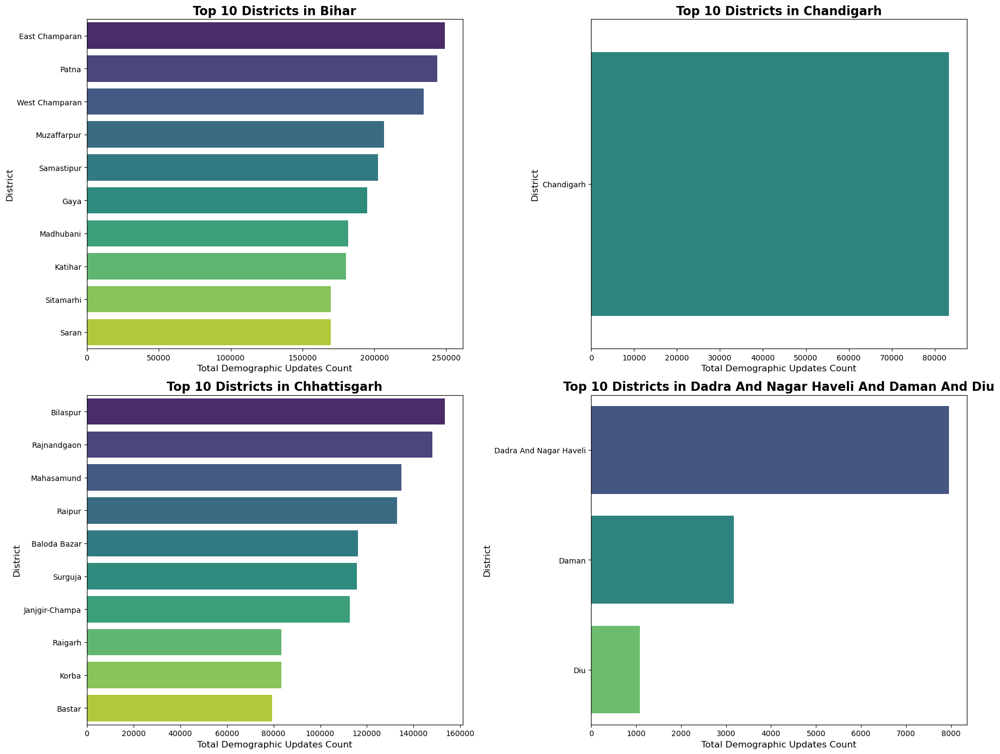

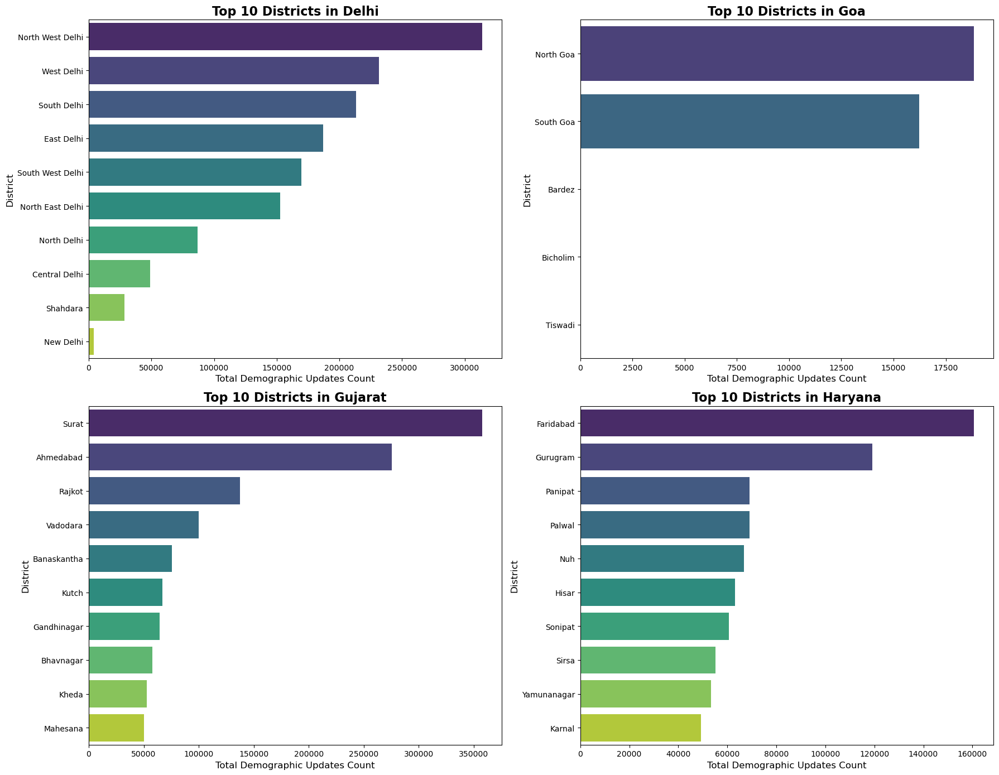

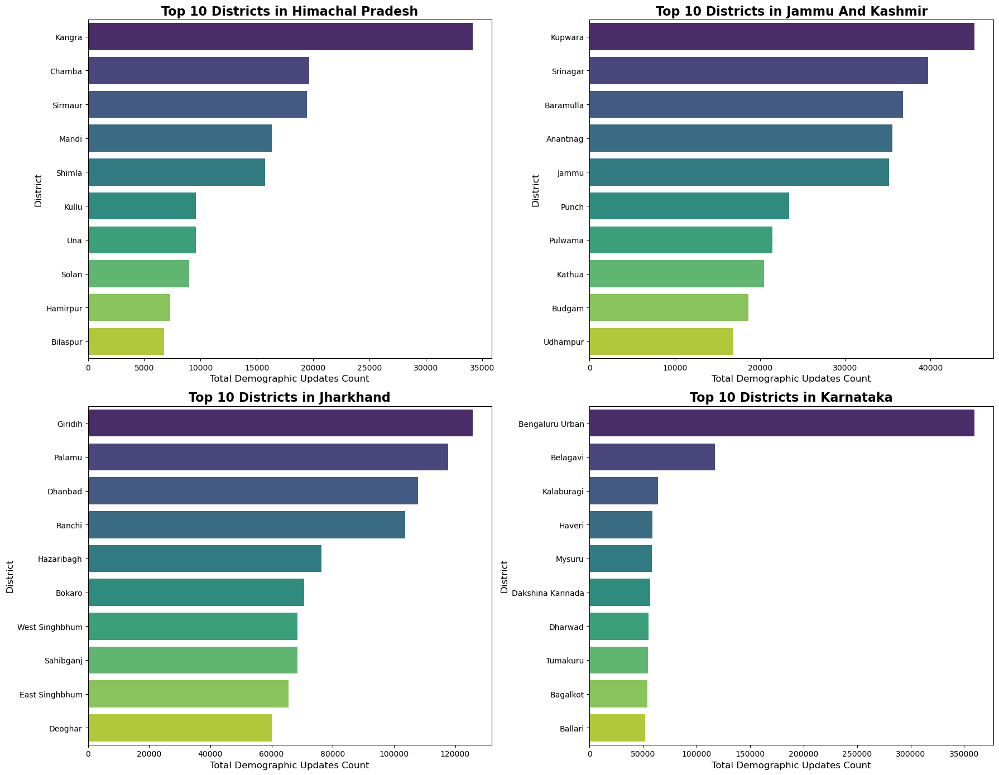

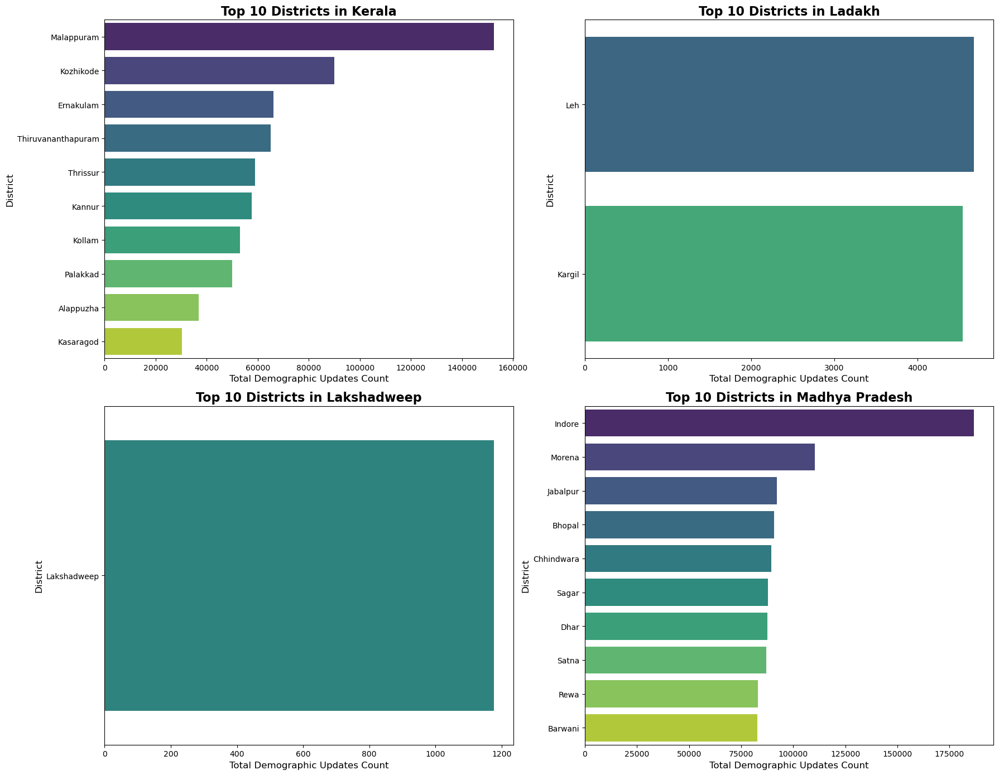

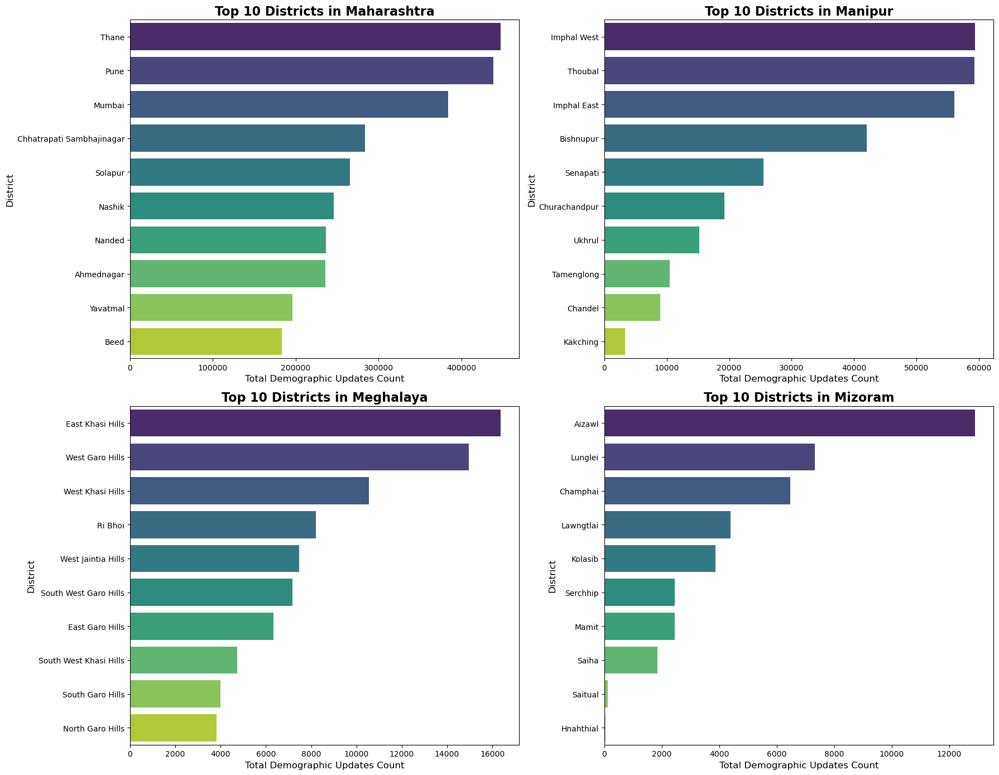

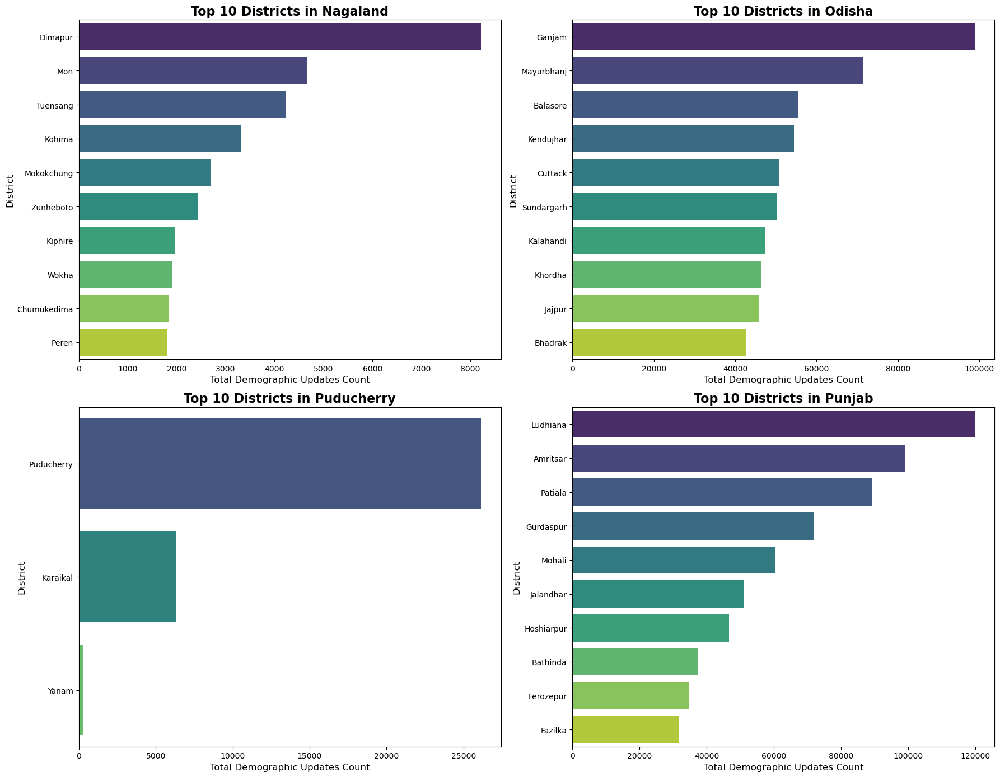

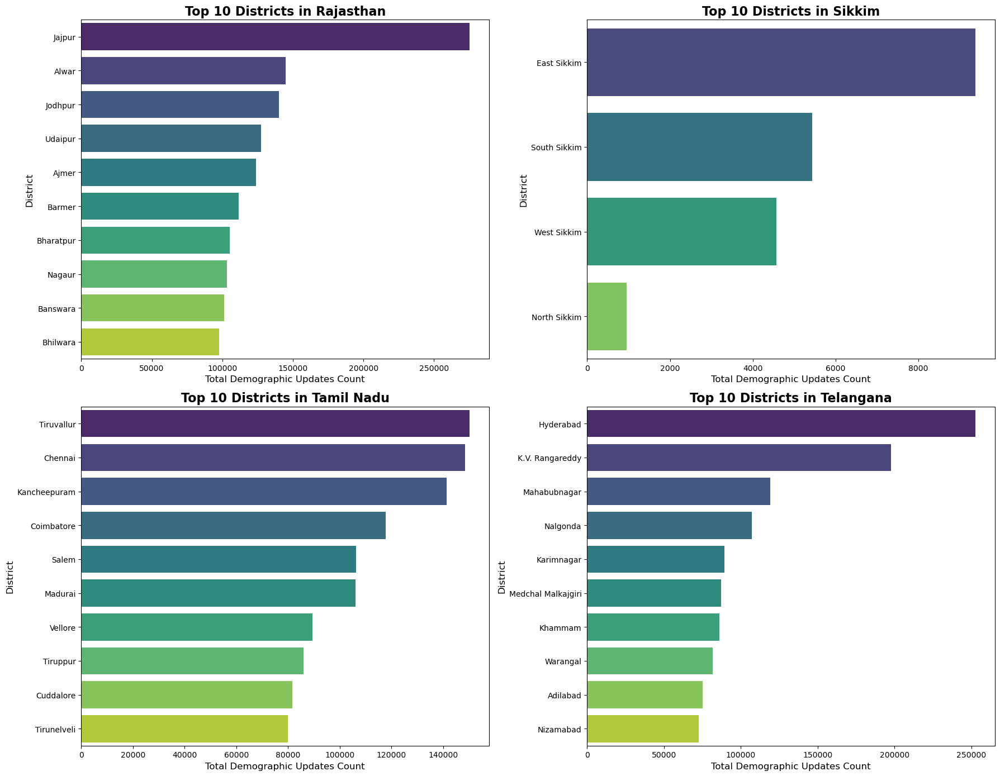

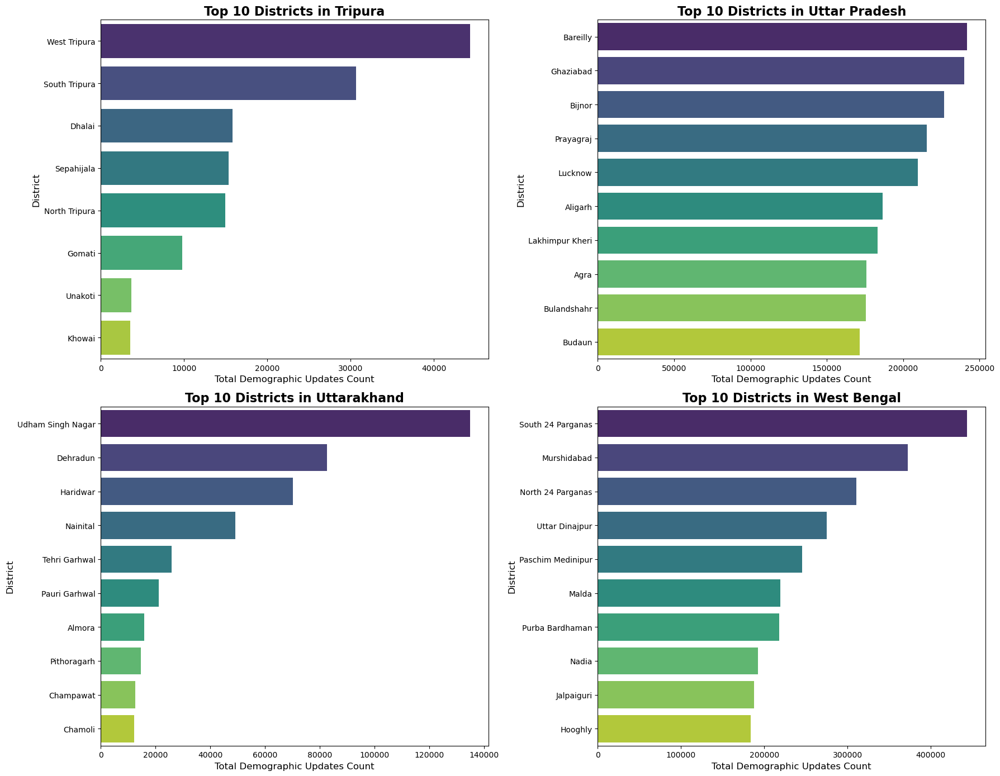

Analysis Complete. 9 batch images generated.


In [24]:
import math
df['total_demographic_updates'] = df['demo_age_5_17'] + df['demo_age_17_']

# 3. Aggregation
district_agg = df.groupby(['state', 'district'])['total_demographic_updates'].sum().reset_index()

# 4. Filter for Top 10
top_10_per_state = district_agg.groupby('state').apply(
    lambda x: x.nlargest(10, 'total_demographic_updates')
).reset_index(drop=True)

# 5. Visualization Setup
states = sorted(top_10_per_state['state'].unique())
num_states = len(states)
states_per_fig = 4  # Number of states to show in one image (2x2 grid)
num_figs = math.ceil(num_states / states_per_fig)

# 6. Plotting Loop
for i in range(num_figs):
    start_idx = i * states_per_fig
    end_idx = min((i + 1) * states_per_fig, num_states)
    current_states = states[start_idx:end_idx]
    
    # Initialize a 2x2 subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for j, state in enumerate(current_states):
        # Get data for the specific state
        state_data = top_10_per_state[top_10_per_state['state'] == state].sort_values('total_demographic_updates', ascending=False)
        
        # Create the bar chart
        sns.barplot(data=state_data, x='total_demographic_updates', y='district', ax=axes[j], palette='viridis')
        
        # Formatting the chart
        axes[j].set_title(f'Top 10 Districts in {state}', fontsize=16, fontweight='bold')
        axes[j].set_xlabel('Total Demographic Updates Count', fontsize=12)
        axes[j].set_ylabel('District', fontsize=12)
        
    # Remove any empty subplots in the final batch
    for k in range(len(current_states), 4):
        fig.delaxes(axes[k])
        
    plt.tight_layout()
    plt.savefig(f'top_districts_batch_{i+1}.png')
    plt.show()

print(f"Analysis Complete. {num_figs} batch images generated.")

In [25]:
month_order = [
    "March", "April", "May", "June",
    "July", "August", "September",
    "October", "November", "December"
]

# Convert month_name to ordered categorical
df["month_name"] = pd.Categorical(
    df["month_name"],
    categories=month_order,
    ordered=True
)

def plot_state_district_trends(state_name):

    # 1. Total demographic updates
    df["total_demographic_updates"] = (
        df['demo_age_5_17'] + df['demo_age_17_']
    )

    # 2. Aggregate total demographic updates by state & district
    district_agg = (
        df.groupby(["state", "district"])["total_demographic_updates"]
        .sum()
        .reset_index()
    )

    # 3. Select top 10 districts for the given state
    top_districts_state = (
        district_agg[district_agg["state"] == state_name]
        .nlargest(10, "total_demographic_updates")
    )

    # 4. Monthly aggregation (IMPORTANT: keep month order)
    monthly = (
        df.groupby(
            ["district", "month_name"],
            observed=True
        )[["demo_age_5_17", "demo_age_17_"]]
        .sum()
        .reset_index()
        .sort_values("month_name")
    )

    fig, axes = plt.subplots(5, 2, figsize=(18, 22))
    fig.suptitle(f"District Trends in {state_name}", fontsize=20)
    axes = axes.flatten()

    for i, dist in enumerate(top_districts_state["district"].values):
        data = monthly[monthly["district"] == dist]

        ax = axes[i]
        ax.plot(data["month_name"], data["demo_age_5_17"], marker="o", label="0-5")
        ax.plot(data["month_name"], data["demo_age_17_"], marker="s", label="5-17")

        ax.set_title(f"District: {dist}")
        ax.set_xlabel("Month")
        ax.set_ylabel("Demographic Updates")
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()



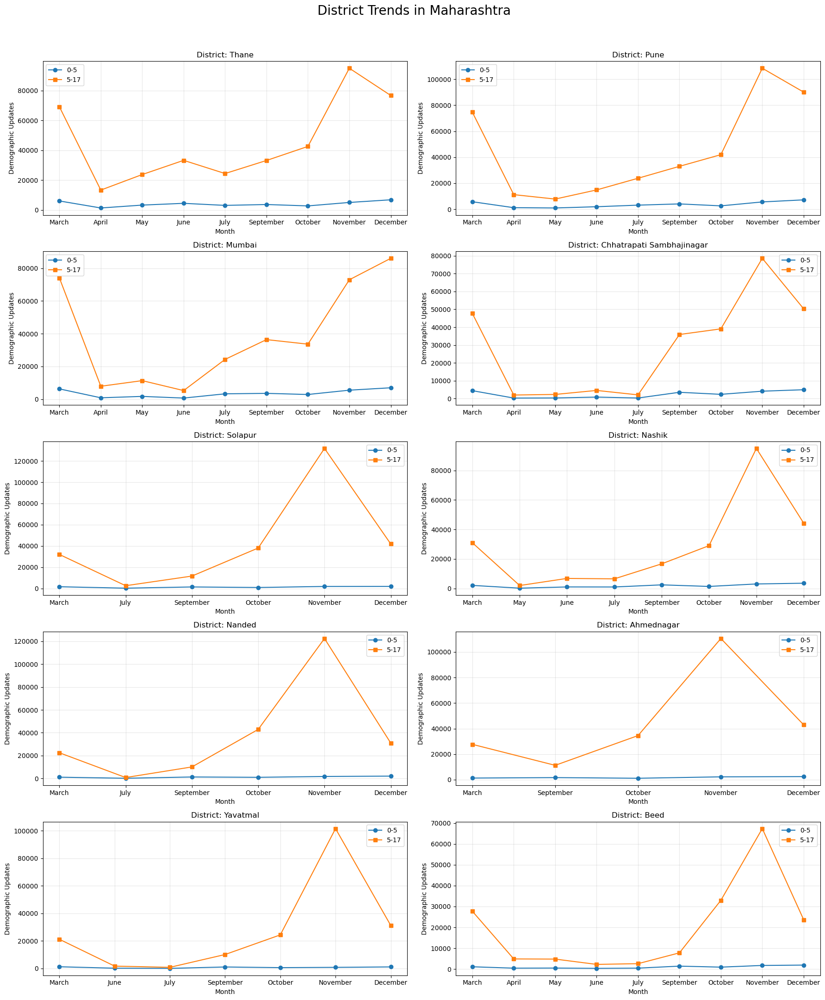

In [26]:
plot_state_district_trends("Maharashtra")

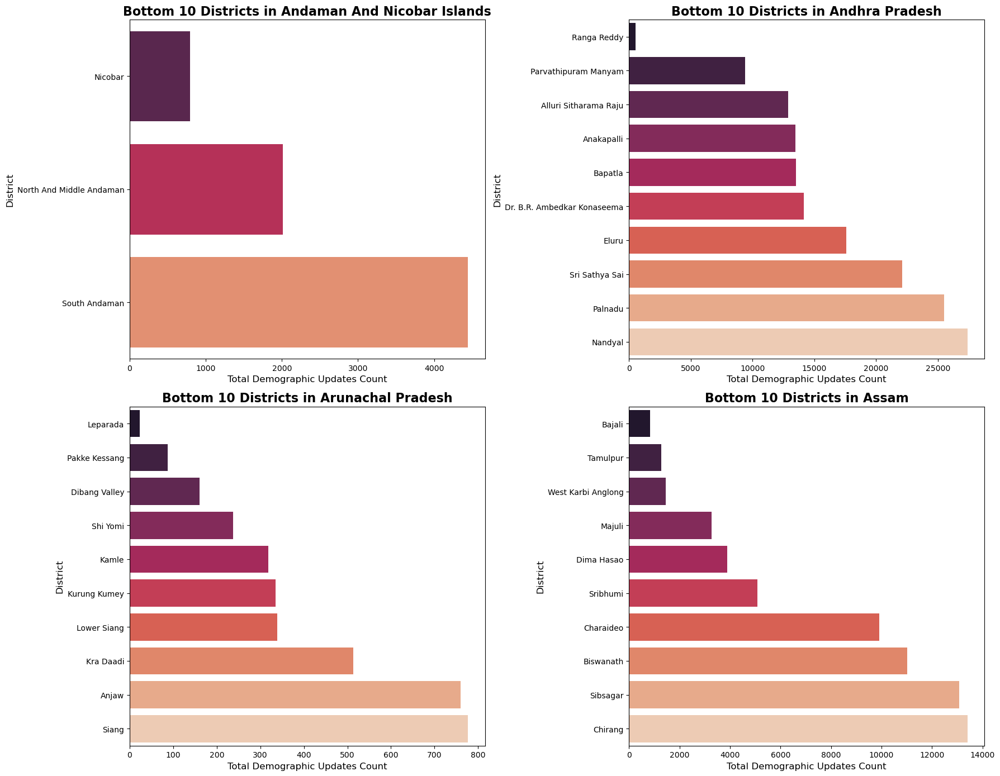

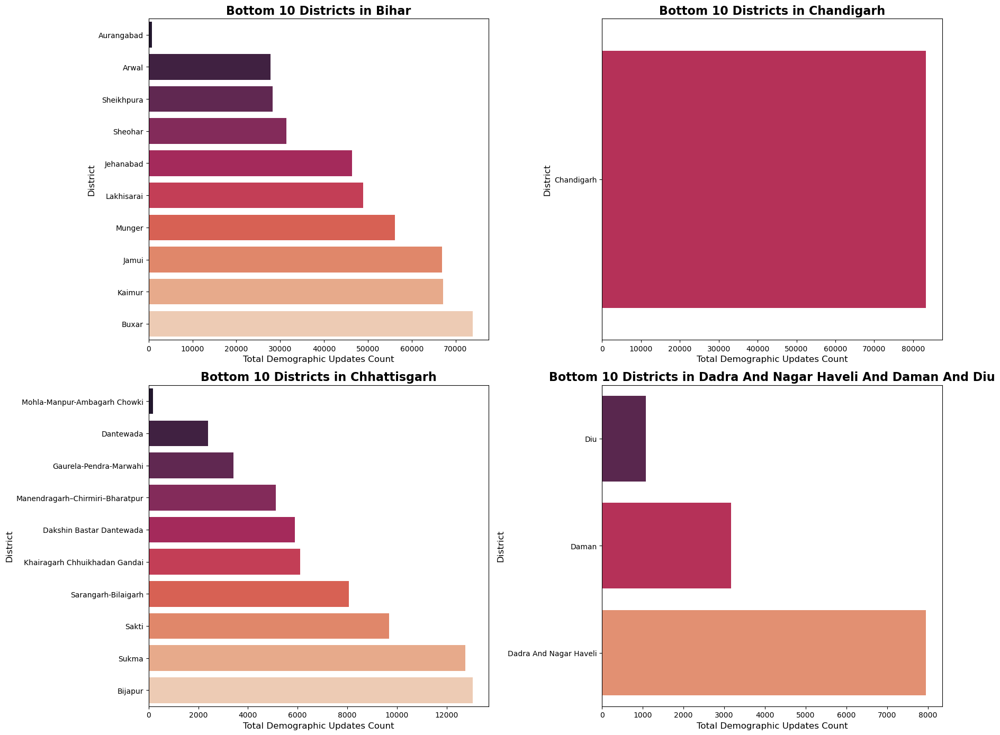

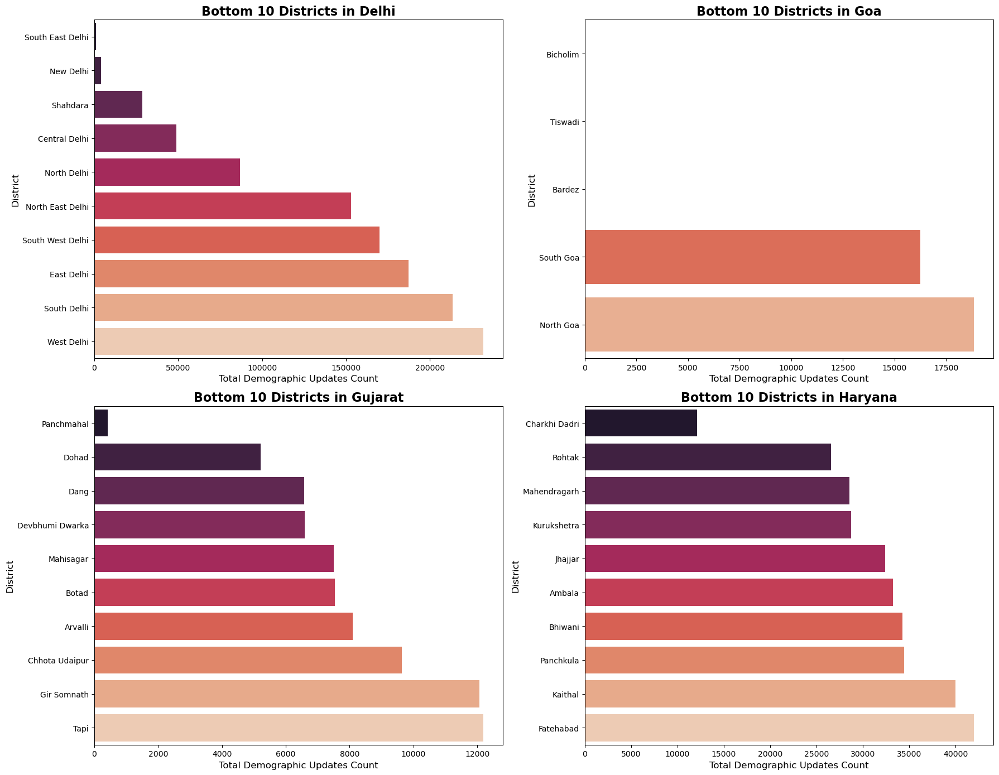

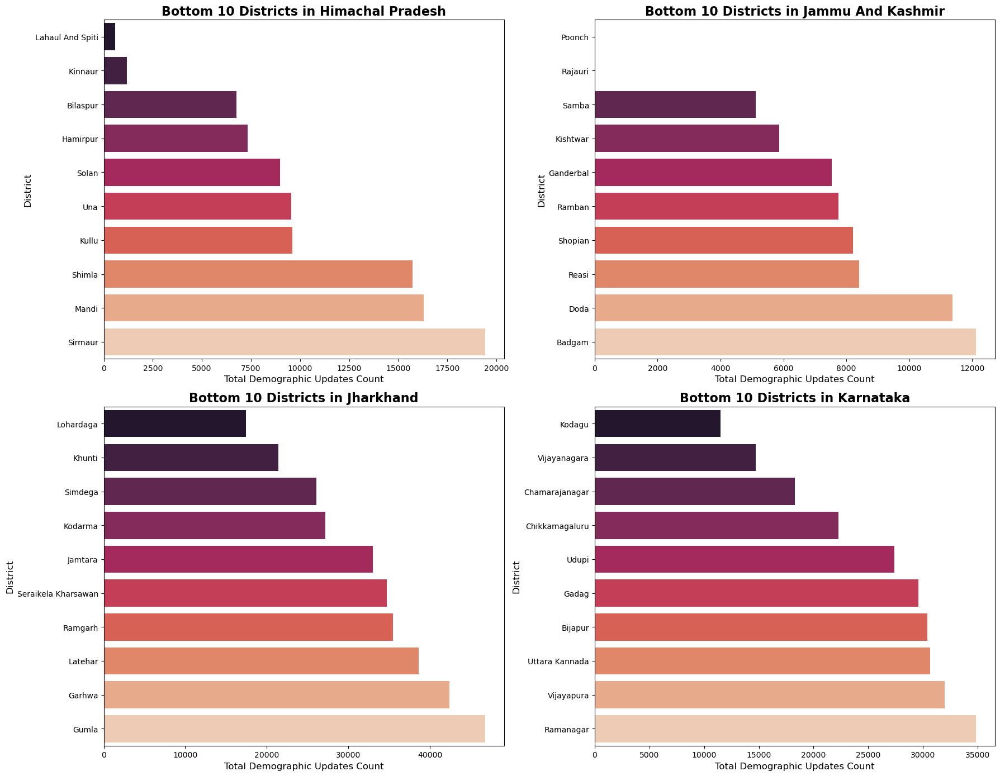

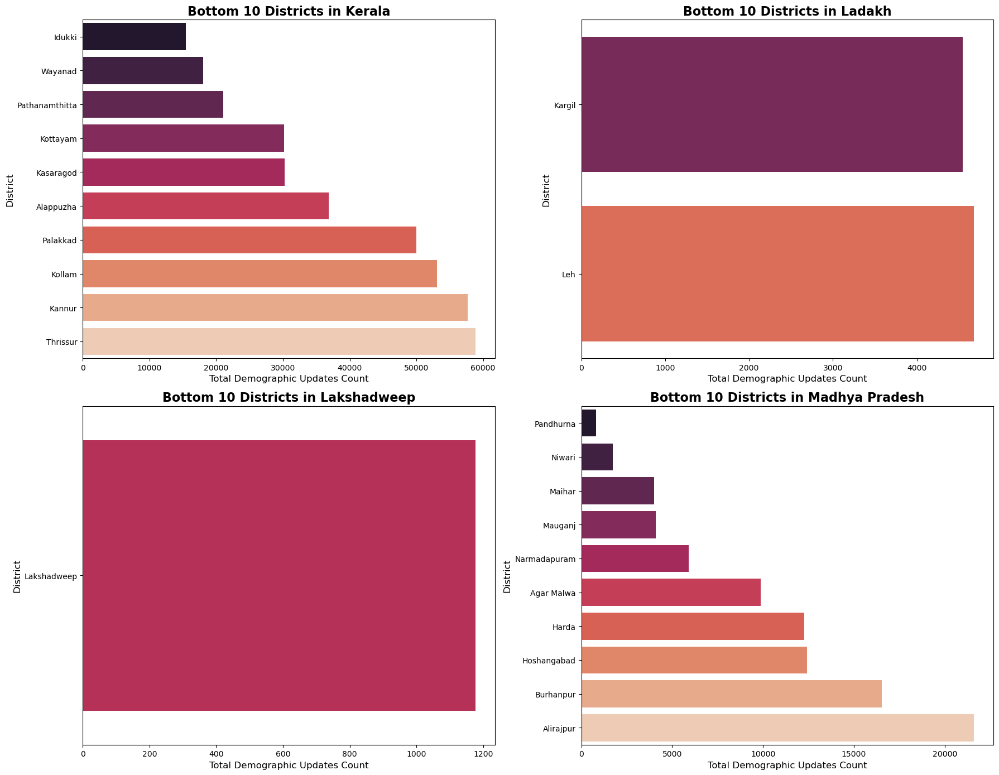

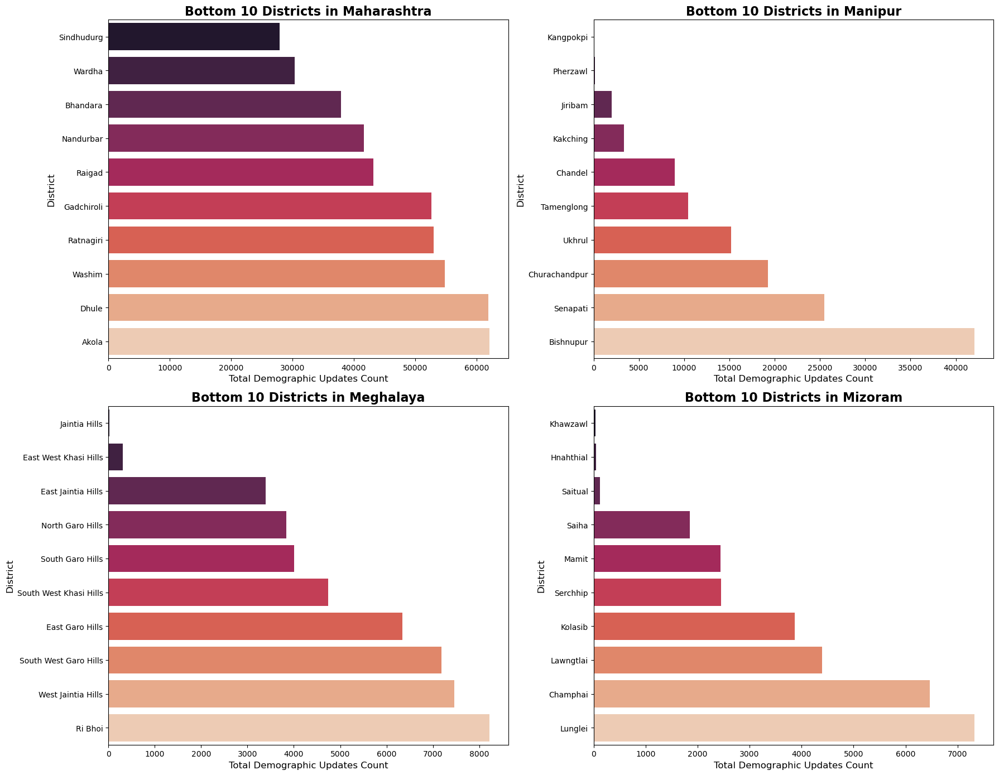

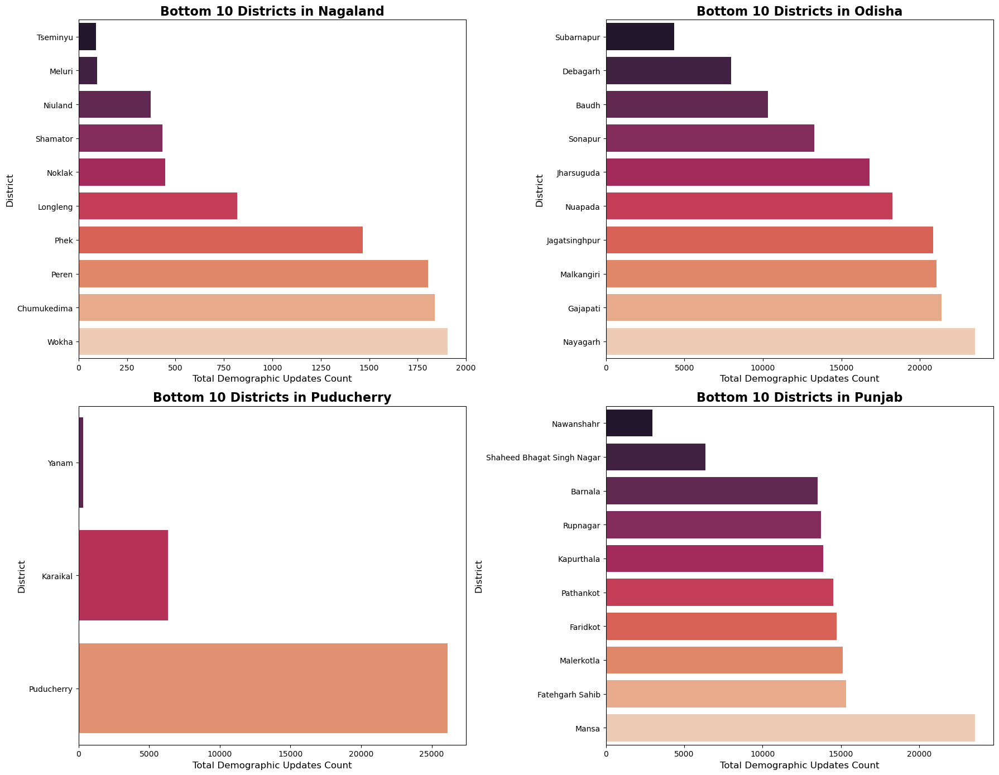

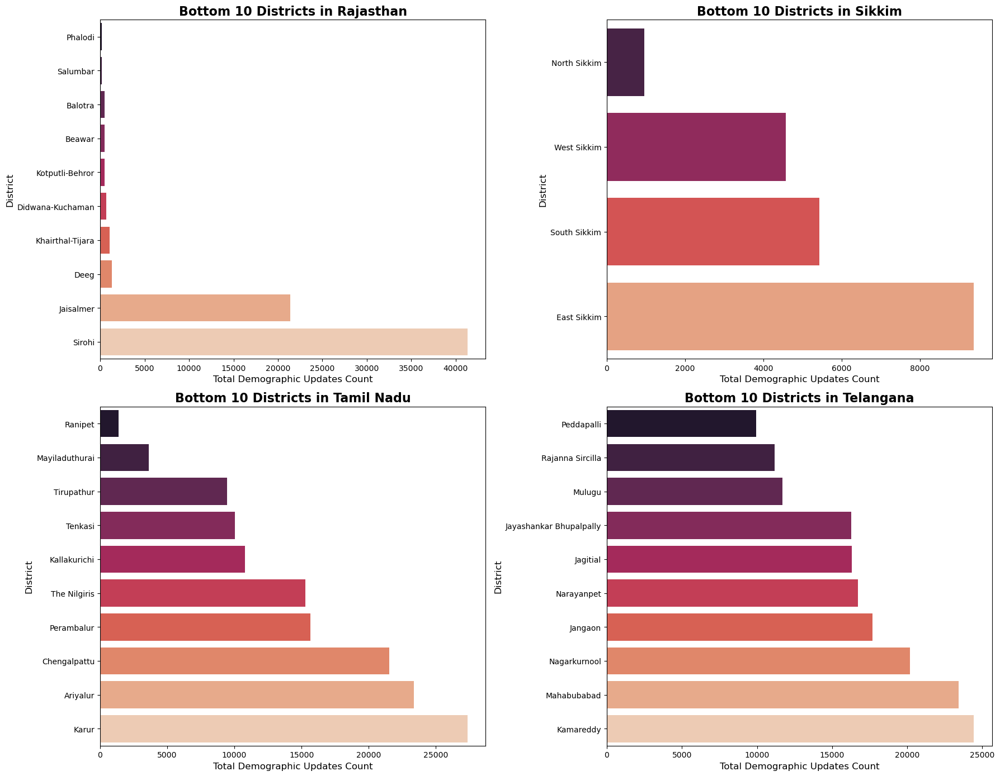

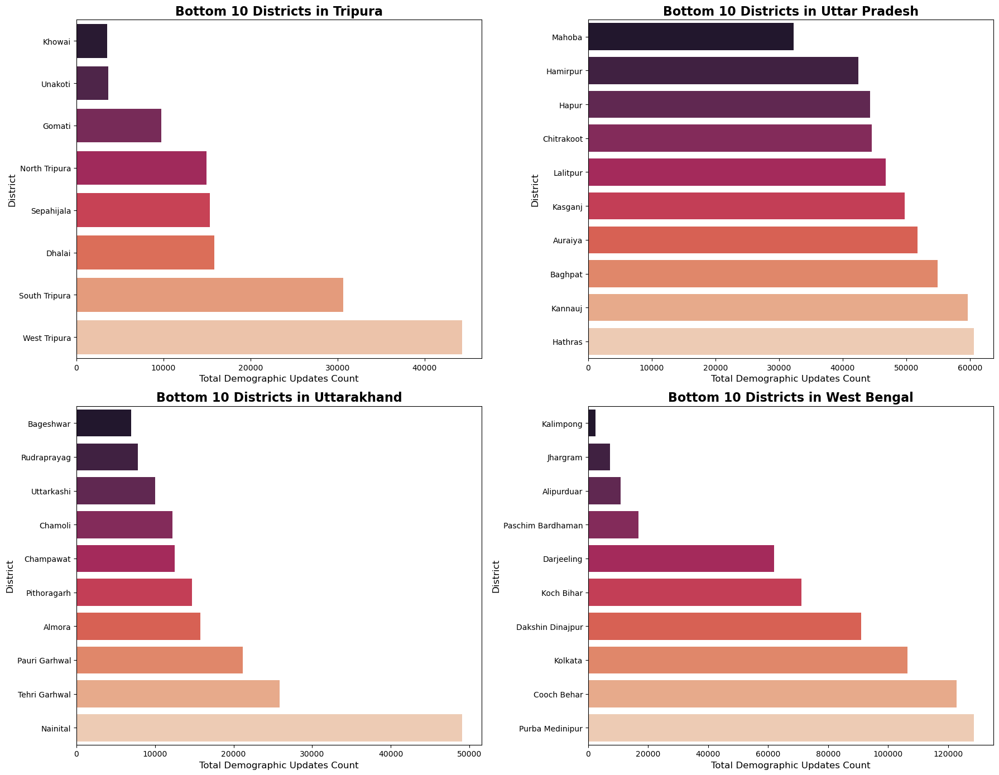

Analysis Complete. 9 batch images generated.


In [27]:
df['total_demographic_updates'] =  df['demo_age_5_17'] + df['demo_age_17_']

# 3. Aggregation
district_agg = df.groupby(['state', 'district'])['total_demographic_updates'].sum().reset_index()

# 4. Filter for Bottom 10 (Changed from nlargest to nsmallest)
bottom_10_per_state = district_agg.groupby('state').apply(
    lambda x: x.nsmallest(10, 'total_demographic_updates')
).reset_index(drop=True)

# 5. Visualization Setup
states = sorted(bottom_10_per_state['state'].unique())
num_states = len(states)
states_per_fig = 4 
num_figs = math.ceil(num_states / states_per_fig)

# 6. Plotting Loop
for i in range(num_figs):
    start_idx = i * states_per_fig
    end_idx = min((i + 1) * states_per_fig, num_states)
    current_states = states[start_idx:end_idx]
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for j, state in enumerate(current_states):
        # Sort data ascending for bottom-up view
        state_data = bottom_10_per_state[bottom_10_per_state['state'] == state].sort_values('total_demographic_updates', ascending=True)
        
        # Create the bar chart
        sns.barplot(data=state_data, x='total_demographic_updates', y='district', ax=axes[j], palette='rocket')
        
        # Formatting the chart
        axes[j].set_title(f'Bottom 10 Districts in {state}', fontsize=16, fontweight='bold')
        axes[j].set_xlabel('Total Demographic Updates Count', fontsize=12)
        axes[j].set_ylabel('District', fontsize=12)
        
    for k in range(len(current_states), 4):
        fig.delaxes(axes[k])
        
    plt.tight_layout()
    plt.savefig(f'bottom_districts_batch_{i+1}.png')
    plt.show()

print(f"Analysis Complete. {num_figs} batch images generated.")

In [28]:
month_order = [
    "March", "April", "May", "June",
    "July", "August", "September",
    "October", "November", "December"
]

# Convert month_name to ordered categorical
df["month_name"] = pd.Categorical(
    df["month_name"],
    categories=month_order,
    ordered=True
)

def plot_state_district_bottom_trends(state_name):

    # 1. Total demographic updates
    df["total_demographic_updates"] = (
        df['demo_age_5_17'] + df['demo_age_17_']
    )

    # 2. Aggregate total demographic updates by state & district
    district_agg = (
        df.groupby(["state", "district"])["total_demographic_updates"]
        .sum()
        .reset_index()
    )

    # 3. Filter for the state and select bottom 10 districts
    bottom_10_districts = (
        district_agg[district_agg["state"] == state_name]
        .nsmallest(10, "total_demographic_updates")
    )

    # 4. Monthly aggregation (KEEP month order)
    monthly = (
        df.groupby(
            ["district", "month_name"],
            observed=True
        )[["demo_age_5_17", "demo_age_17_"]]
        .sum()
        .reset_index()
        .sort_values("month_name")
    )


    fig, axes = plt.subplots(5, 2, figsize=(18, 22))
    fig.suptitle(f"Bottom 10 District Trends in {state_name}", fontsize=20)
    axes = axes.flatten()

    for i, dist in enumerate(bottom_10_districts["district"].values):
        data = monthly[monthly["district"] == dist]

        ax = axes[i]
        ax.plot(data["month_name"], data["demo_age_5_17"], marker="o", label="0-5")
        ax.plot(data["month_name"], data["demo_age_17_"], marker="s", label="5-17")

        ax.set_title(f"District: {dist}")
        ax.set_xlabel("Month")
        ax.set_ylabel("Demographic Updates")
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis="x", rotation=45)

    # Hide unused subplots if districts < 10
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

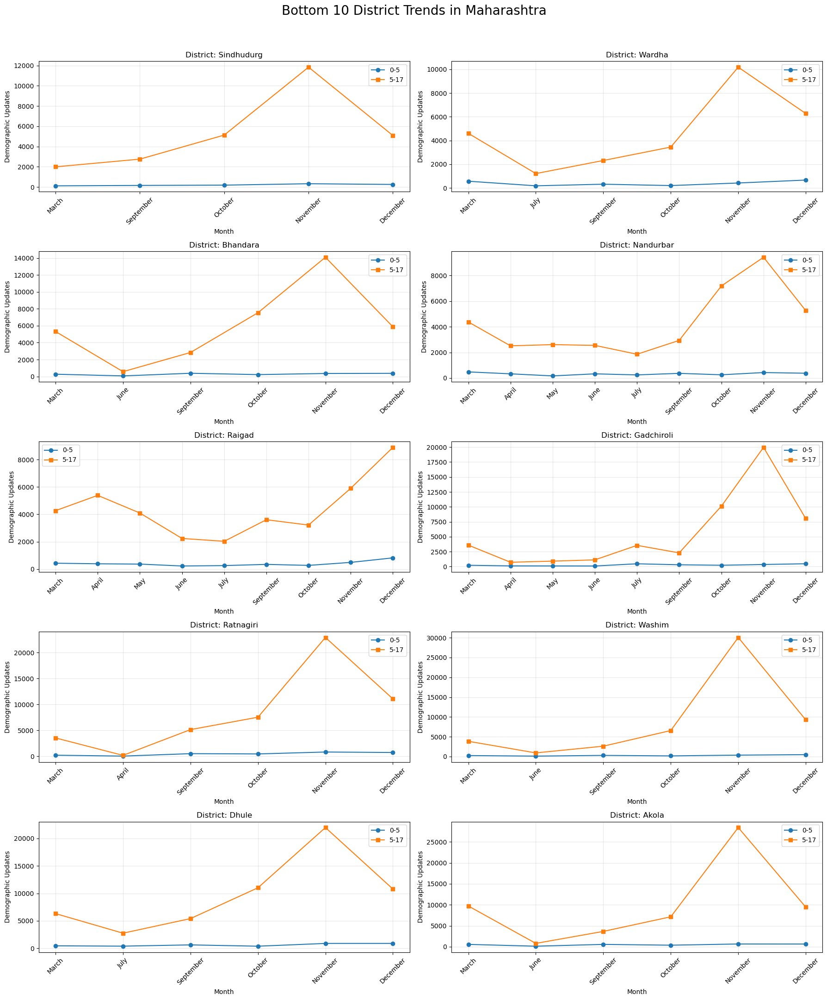

In [29]:
plot_state_district_bottom_trends('Maharashtra')

In [30]:
min_date = demo_df['date'].min()
max_date = demo_df['date'].max()
print(f"Minimum date: {min_date}")
print(f"Maximum date: {max_date}")

Minimum date: 2025-03-01
Maximum date: 2025-12-29


In [31]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'demo_age_5_17', 'demo_age_17_',
       'month', 'month_name', 'total_demographic_updates'],
      dtype='object')

In [32]:
df = pd.read_csv('demo_df.csv')

In [33]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'demo_age_5_17', 'demo_age_17_',
       'month', 'month_name'],
      dtype='object')

In [34]:
df["date"] = pd.to_datetime(df["date"], format="%Y-%m-%d")

# Extract day of week
df["day_of_week"] = df["date"].dt.day_name()

In [35]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'demo_age_5_17', 'demo_age_17_',
       'month', 'month_name', 'day_of_week'],
      dtype='object')

In [36]:
df["day_type"] = df["date"].dt.weekday.apply(
    lambda x: "Weekend" if x >= 5 else "Weekday"
)


In [37]:
df.head()

,date,state,district,pincode,demo_age_5_17,demo_age_17_,month,month_name,day_of_week,day_type
0,2025-03-01,Uttar Pradesh,Gorakhpur,273213,49,529,3,March,Saturday,Weekend
1,2025-03-01,Andhra Pradesh,Chittoor,517132,22,375,3,March,Saturday,Weekend
2,2025-03-01,Gujarat,Rajkot,360006,65,765,3,March,Saturday,Weekend
3,2025-03-01,Andhra Pradesh,Srikakulam,532484,24,314,3,March,Saturday,Weekend
4,2025-03-01,Rajasthan,Udaipur,313801,45,785,3,March,Saturday,Weekend


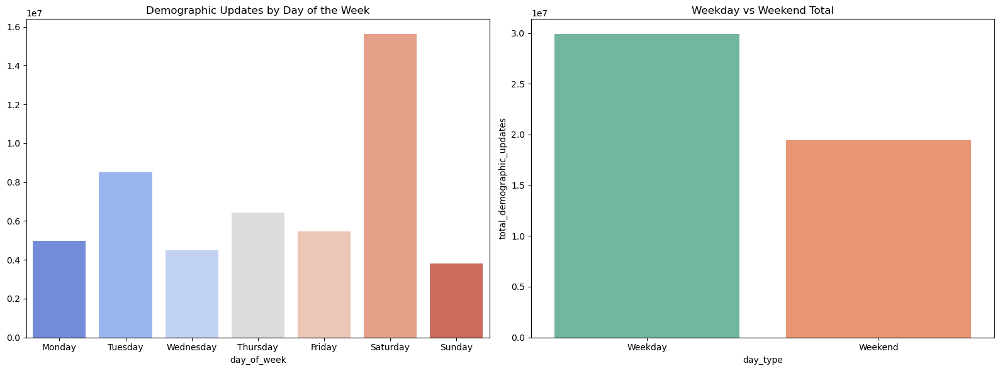

In [38]:
df['total_demographic_updates'] = df['demo_age_5_17'] + df['demo_age_17_']

# Grouping for Day of the Week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_data = df.groupby('day_of_week')['total_demographic_updates'].sum().reindex(day_order)
# Plotting
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Weekly Distribution
sns.barplot(x=weekly_data.index, y=weekly_data.values, ax=axes[0], palette='coolwarm')
axes[0].set_title('Demographic Updates by Day of the Week')

# Plot 2: Weekday vs Weekend
sns.barplot(data=df.groupby('day_type')['total_demographic_updates'].sum().reset_index(), 
            x='day_type', y='total_demographic_updates', ax=axes[1], palette='Set2')
axes[1].set_title('Weekday vs Weekend Total')

plt.tight_layout()
plt.show()

In [39]:
# Group by month_name and get unique day names for each month
days_names_per_month = df.groupby('month_name')['day_of_week'].apply(lambda x: sorted(x.unique())).reset_index()
print(days_names_per_month)

  month_name                                        day_of_week
0      April                                          [Tuesday]
1   December  [Friday, Monday, Saturday, Sunday, Thursday, T...
2       July                                          [Tuesday]
3       June                                           [Sunday]
4      March                                         [Saturday]
5        May                                         [Thursday]
6   November  [Friday, Monday, Saturday, Sunday, Thursday, T...
7    October  [Friday, Monday, Saturday, Sunday, Thursday, T...
8  September  [Friday, Monday, Saturday, Sunday, Thursday, T...


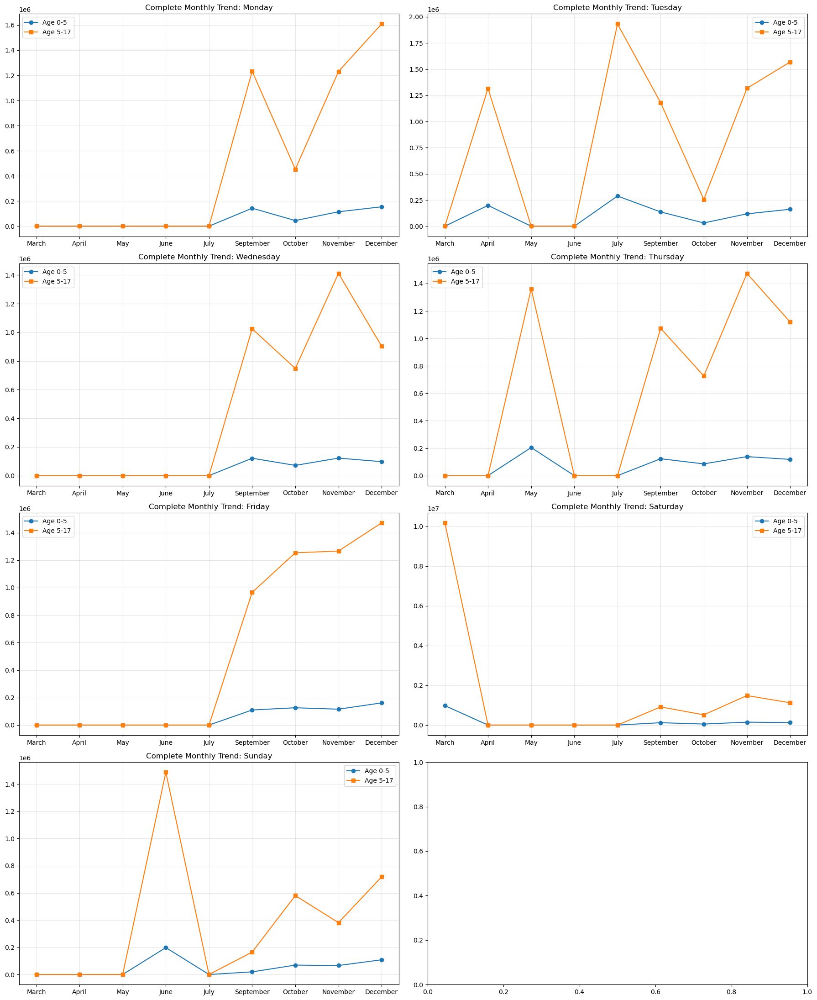

In [40]:
month_info = df[['month', 'month_name']].drop_duplicates().sort_values('month')
all_months = month_info['month_name'].tolist()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Aggregate
daily_monthly_age = df.groupby(['day_of_week', 'month_name'])[["demo_age_5_17", "demo_age_17_"]].sum().reset_index()

# Plotting 7 charts (one for each day)
fig, axes = plt.subplots(4, 2, figsize=(18, 22))
axes = axes.flatten()

for i, day in enumerate(day_order):
    ax = axes[i]
    # Filter and reindex to include ALL months (filling missing with 0)
    day_data = daily_monthly_age[daily_monthly_age['day_of_week'] == day]
    day_data_full = day_data.set_index('month_name').reindex(all_months).fillna(0).reset_index()
    
    # Plot lines
    ax.plot(day_data_full['month_name'], day_data_full['demo_age_5_17'], marker='o', label='Age 0-5')
    ax.plot(day_data_full['month_name'], day_data_full['demo_age_17_'], marker='s', label='Age 5-17')

    ax.set_title(f'Complete Monthly Trend: {day}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

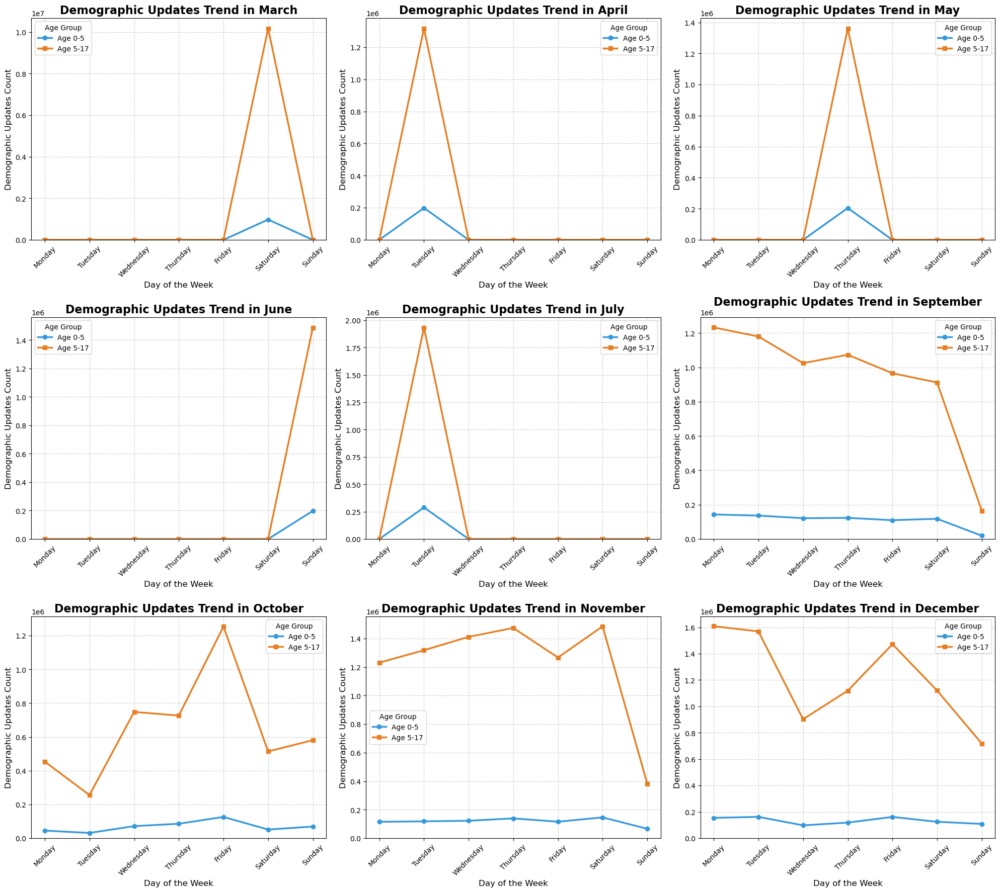

Analysis Complete. 9 month charts generated.


In [41]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Get unique month names in the correct chronological order using the numeric 'month' column
month_info = df[['month', 'month_name']].drop_duplicates().sort_values('month')
all_months = month_info['month_name'].unique().tolist()

# 3. Aggregate the data by Month (numeric), Month Name, and Day of Week
monthly_daily_age = df.groupby(['month', 'month_name', 'day_of_week'])[["demo_age_5_17", "demo_age_17_"]].sum().reset_index()

# 4. Create subplots for each month
num_months = len(all_months)
cols = 3
rows = math.ceil(num_months / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 6))
axes = axes.flatten()

for i, month_name in enumerate(all_months):
    ax = axes[i]
    
    # Filter for the specific month name
    month_data = monthly_daily_age[monthly_daily_age['month_name'] == month_name]
    
    # FIXED STEP: Ensure day_of_week labels are unique before reindexing
    # We group by day_of_week and sum again to aggregate any duplicate month names
    month_data_grouped = month_data.groupby('day_of_week')[["demo_age_5_17", "demo_age_17_"]].sum()
    
    # Reindex to ensure ALL 7 days of the week are present on the chart
    month_data_full = month_data_grouped.reindex(day_order).fillna(0).reset_index()
    
    # 5. Plotting
    ax.plot(month_data_full['day_of_week'], month_data_full['demo_age_5_17'], marker='o', label='Age 0-5', linewidth=2.5, color='#3498db')
    ax.plot(month_data_full['day_of_week'], month_data_full['demo_age_17_'], marker='s', label='Age 5-17', linewidth=2.5, color='#e67e22')

    ax.set_title(f'Demographic Updates Trend in {month_name}', fontsize=16, fontweight='bold')
    ax.set_xlabel('Day of the Week', fontsize=12)
    ax.set_ylabel('Demographic Updates Count', fontsize=12)
    ax.legend(title='Age Group')
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_ylim(bottom=0)
    ax.tick_params(axis='x', rotation=45)

# Remove any extra empty subplots
for k in range(num_months, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.savefig('monthly_daywise_trends_fixed.png')
plt.show()

print(f"Analysis Complete. {num_months} month charts generated.")

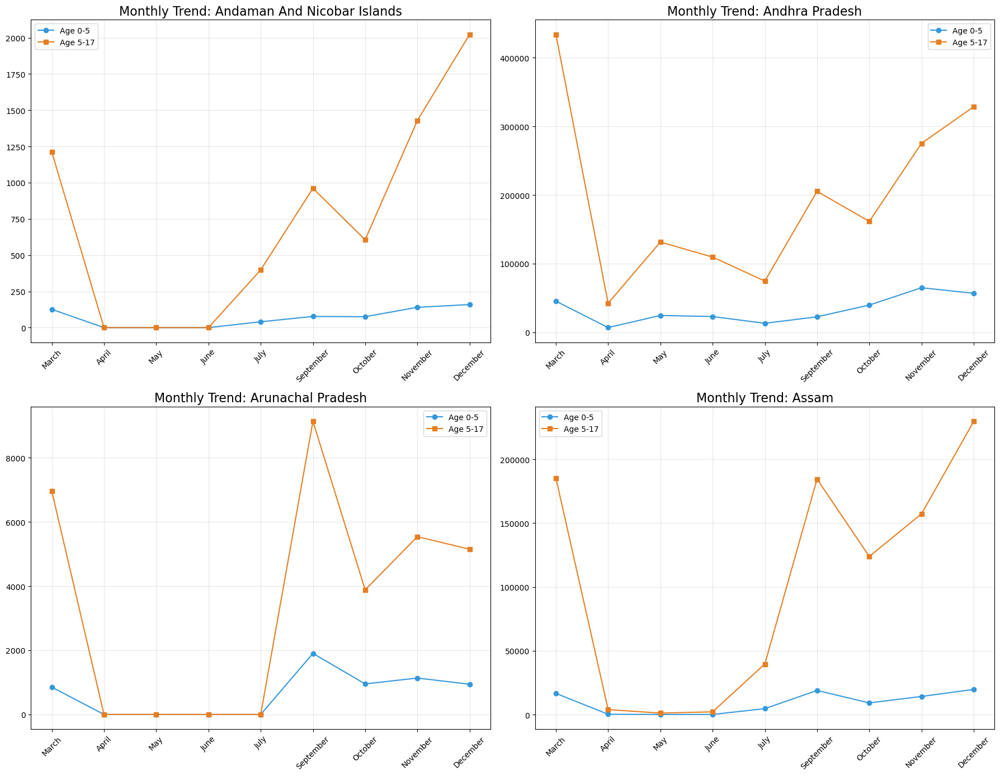

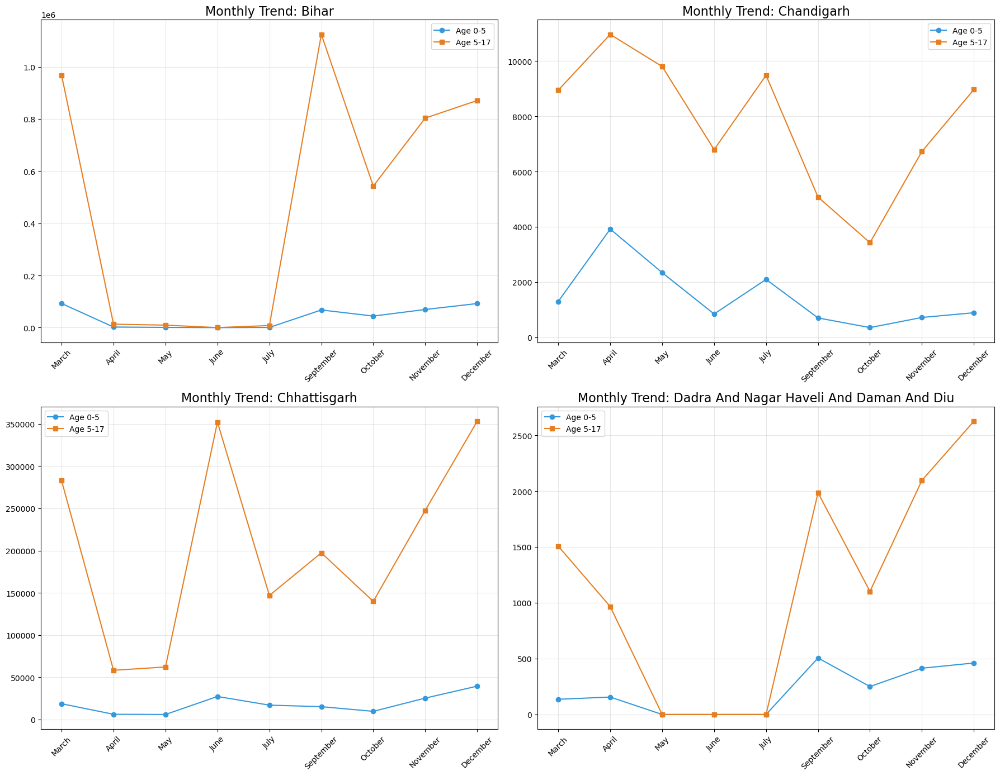

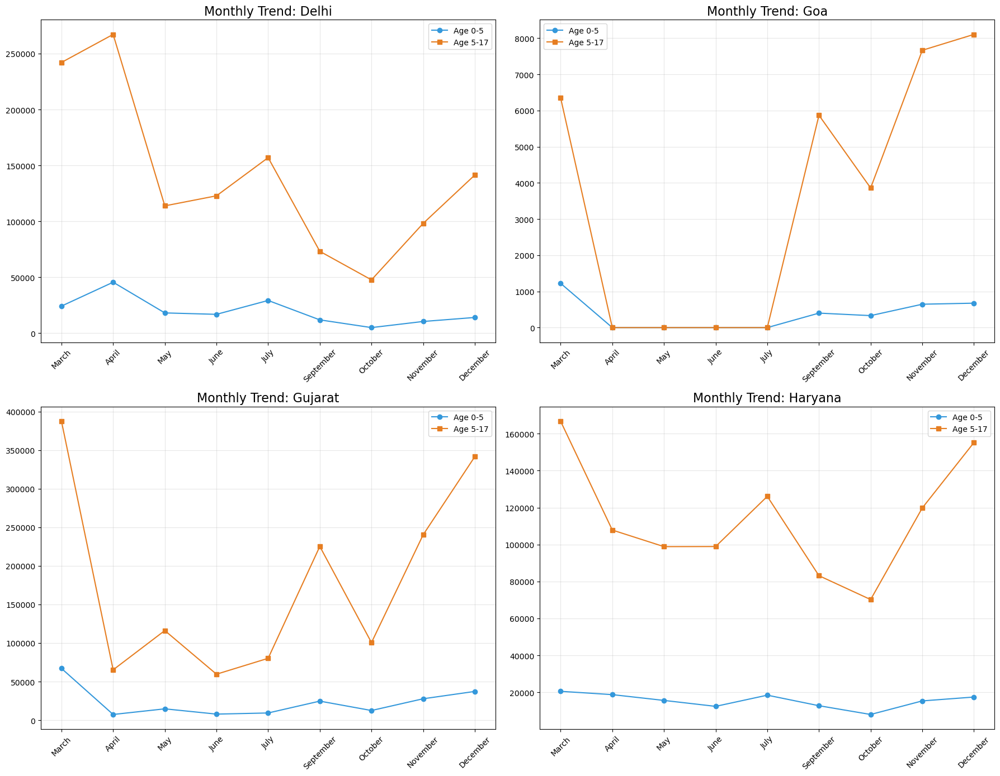

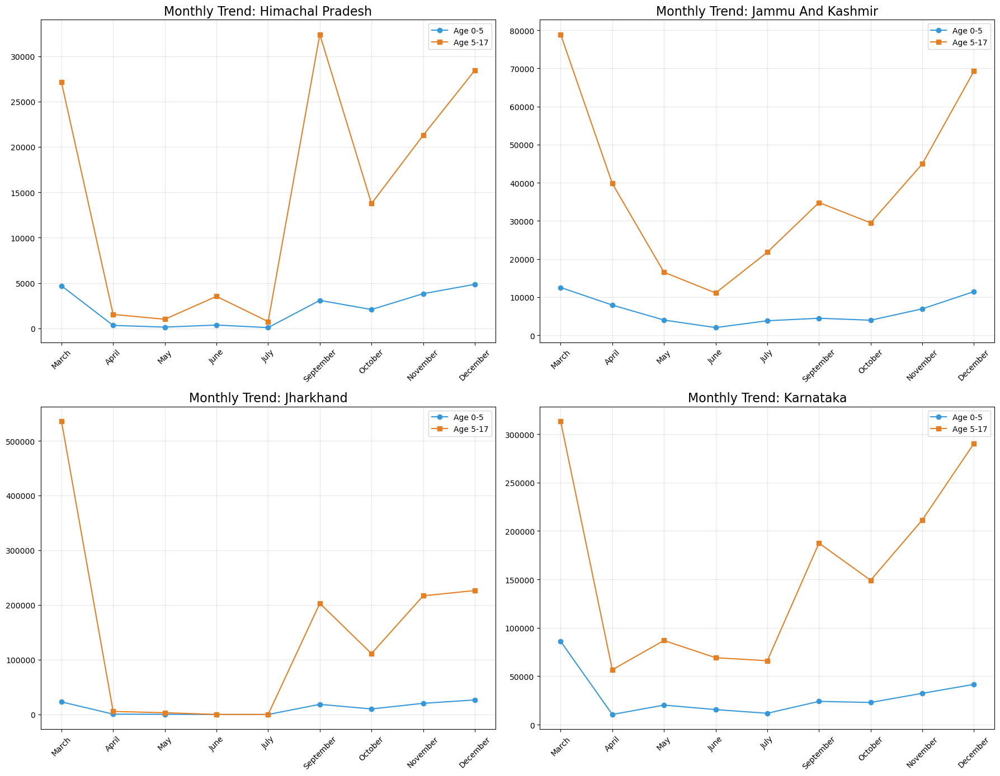

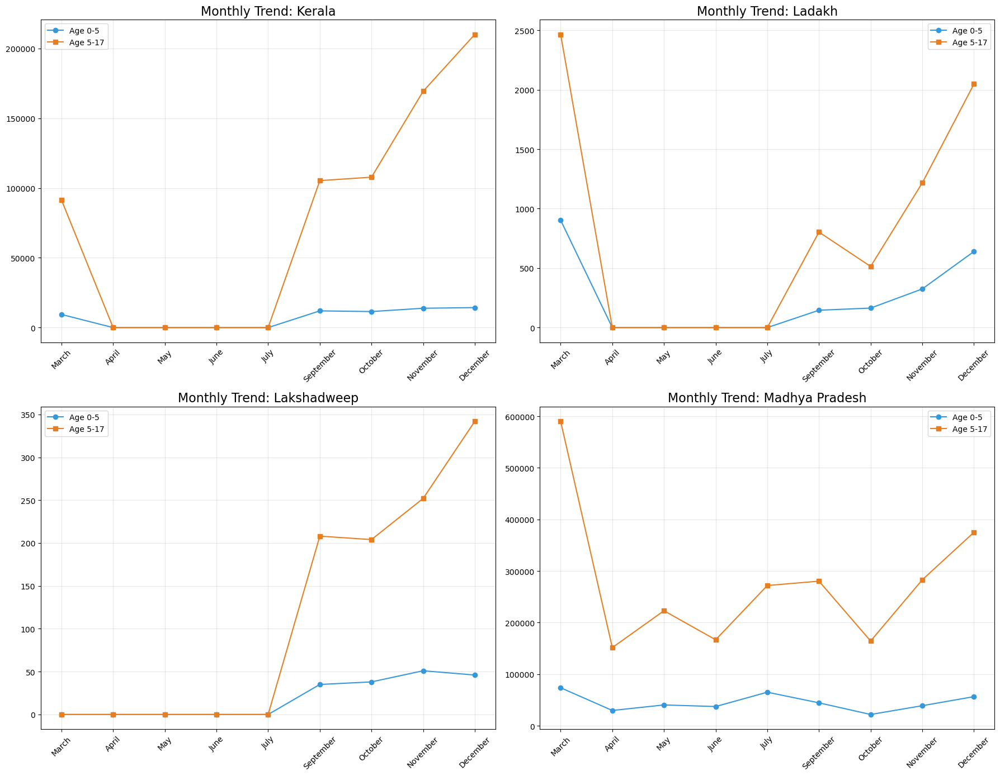

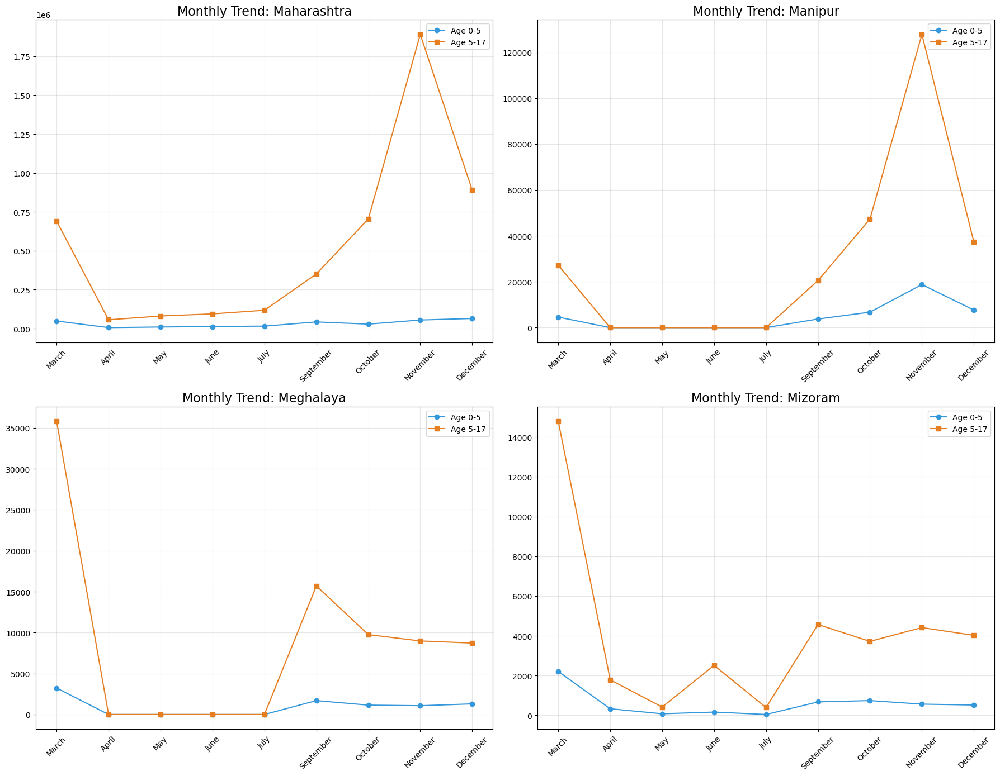

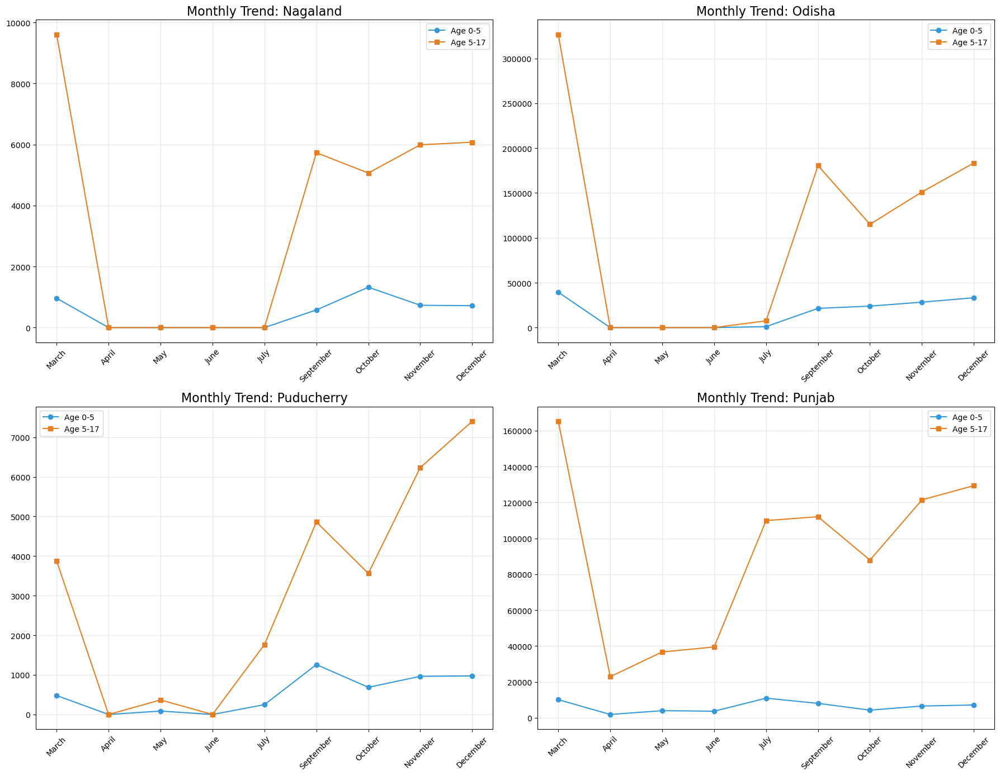

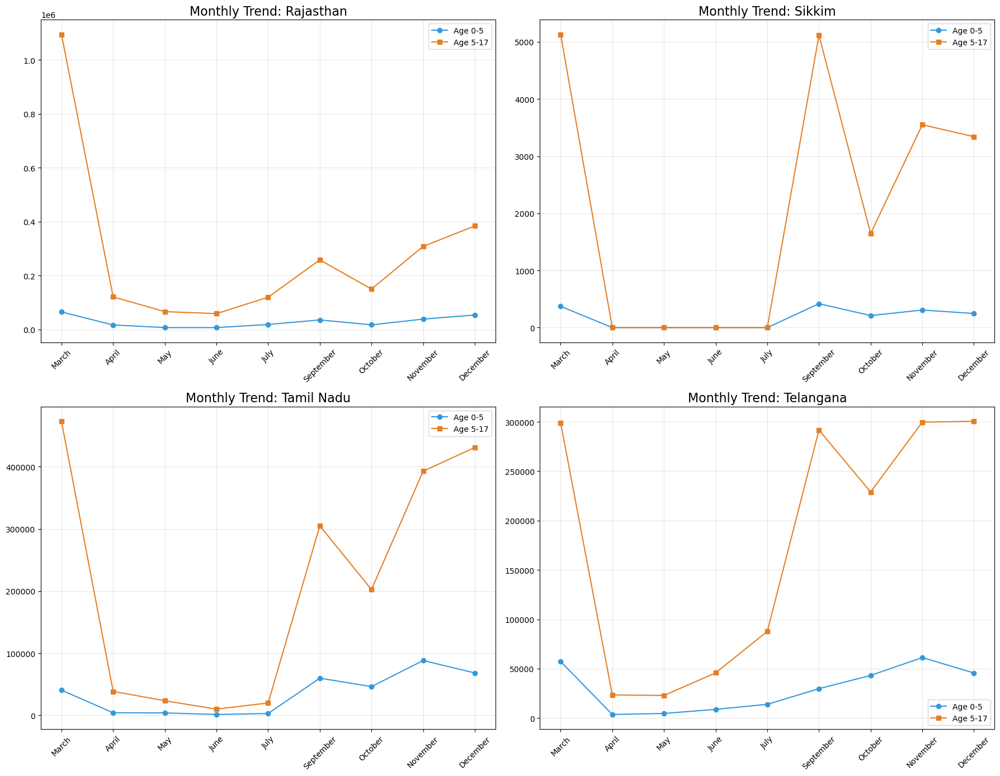

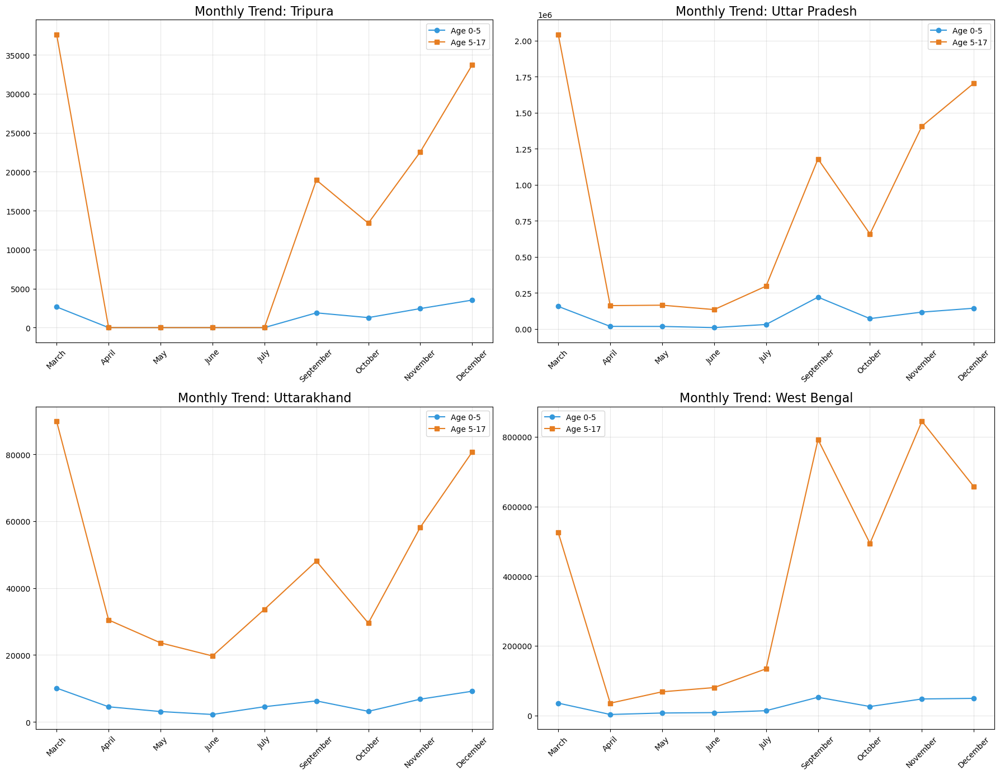

In [42]:
month_info = df[['month', 'month_name']].drop_duplicates().sort_values('month')
all_months = month_info['month_name'].tolist()

# 3. Aggregation
state_monthly = df.groupby(['state', 'month', 'month_name'])[["demo_age_5_17", "demo_age_17_"]].sum().reset_index()
states = sorted(state_monthly['state'].unique())

# 4. Plotting in Batches (4 states per image)
num_states = len(states)
num_figs = math.ceil(num_states / 4)

for i in range(num_figs):
    current_batch = states[i*4 : (i+1)*4]
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()
    
    for j, state in enumerate(current_batch):
        # Filter for the state and ensure ALL months are present
        data = state_monthly[state_monthly['state'] == state]
        data_full = data.set_index('month_name').reindex(all_months).fillna(0).reset_index()
        
        ax = axes[j]
        ax.plot(data_full['month_name'], data_full['demo_age_5_17'], marker='o', label='Age 0-5', color='#3498db')
        ax.plot(data_full['month_name'], data_full['demo_age_17_'], marker='s', label='Age 5-17', color='#e67e22')

        ax.set_title(f'Monthly Trend: {state}', fontsize=16)
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=45)

    # Clean up empty subplots
    for k in range(len(current_batch), 4): fig.delaxes(axes[k])
    
    plt.tight_layout()
    plt.savefig(f'state_monthly_age_trend_batch_{i+1}.png')
    plt.show()

In [43]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
all_months = df.sort_values('month')['month_name'].unique().tolist()

def plot_state_monthly_day_trends(state_name):
    # Filter and aggregate
    state_df = df[df['state'] == state_name]
    monthly_daily = state_df.groupby(['month', 'month_name', 'day_of_week'])[["demo_age_5_17", "demo_age_17_"]].sum().reset_index()
    
    # Grid setup (3x3 for 9 months)
    rows, cols = 3, 3
    fig, axes = plt.subplots(rows, cols, figsize=(18, 15))
    axes = axes.flatten()
    
    for i, month in enumerate(all_months):
        ax = axes[i]
        # Aggregate and reindex for 7 days
        m_data = monthly_daily[monthly_daily['month_name'] == month].groupby('day_of_week').sum()
        m_data_full = m_data.reindex(day_order).fillna(0).reset_index()
        
        # Plotting
        ax.plot(m_data_full['day_of_week'], m_data_full['demo_age_5_17'], marker='o', label='0-5')
        ax.plot(m_data_full['day_of_week'], m_data_full['demo_age_17_'], marker='s', label='5-17')

        ax.set_title(month, fontweight='bold')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, alpha=0.3)
        if i == 0: ax.legend()

    fig.suptitle(f'Monthly Day-wise Trends: {state_name}', fontsize=20)
    plt.tight_layout()
    plt.show()


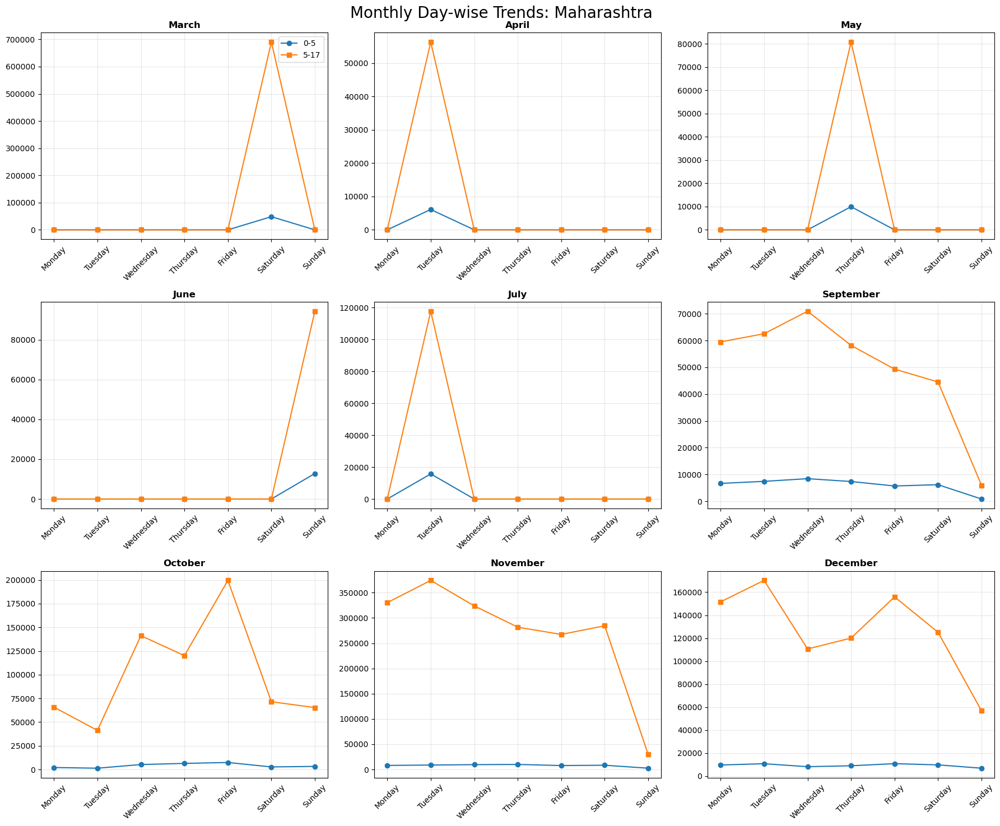

In [44]:
plot_state_monthly_day_trends('Maharashtra')

In [45]:
month_order = ["March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Convert to ordered categorical for proper sorting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def plot_state_district_day_trends(state_name):
    # 3. Total demographic updates for ranking
    df["total_demographic_updates"] = df["demo_age_5_17"] + df["demo_age_17_"]

    # 4. Select top 10 districts for the given state
    district_agg = df[df["state"] == state_name].groupby("district")["total_demographic_updates"].sum().reset_index()
    top_districts = district_agg.nlargest(10, "total_demographic_updates")["district"].values
    
    # 5. Filter and Aggregate by District, Month, AND Day of Week
    df_filtered = df[(df["state"] == state_name) & (df["district"].isin(top_districts))].copy()
    
    agg = df_filtered.groupby(["district", "month_name", "day_of_week"], observed=True)[
        ["demo_age_17_", "demo_age_5_17"]
    ].sum().reset_index()

    # Sort to ensure continuous timeline (Chronological)
    agg = agg.sort_values(["district", "month_name", "day_of_week"])

    # Create descriptive X-axis labels (e.g., Sep-Mon)
    agg["label"] = agg["month_name"].astype(str).str[:3] + "-" + agg["day_of_week"].astype(str).str[:3]

    # 6. Plotting - Using 10 rows to give the detailed timeline more room
    fig, axes = plt.subplots(10, 1, figsize=(20, 45))
    fig.suptitle(f"Individual Day-wise Trends for Top 10 Districts in {state_name}", fontsize=24, y=1.0)
    
    for i, dist in enumerate(top_districts):
        data = agg[agg["district"] == dist]
        ax = axes[i]

        ax.plot(data["label"], data["demo_age_5_17"], marker="o", label="0-5", linewidth=1.5)
        ax.plot(data["label"], data["demo_age_17_"], marker="s", label="5-17", linewidth=1.5)

        ax.set_title(f"District: {dist}", fontsize=18, fontweight='bold')
        ax.set_ylabel("Demographic Updates Count")
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=90) # Rotate for readability

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


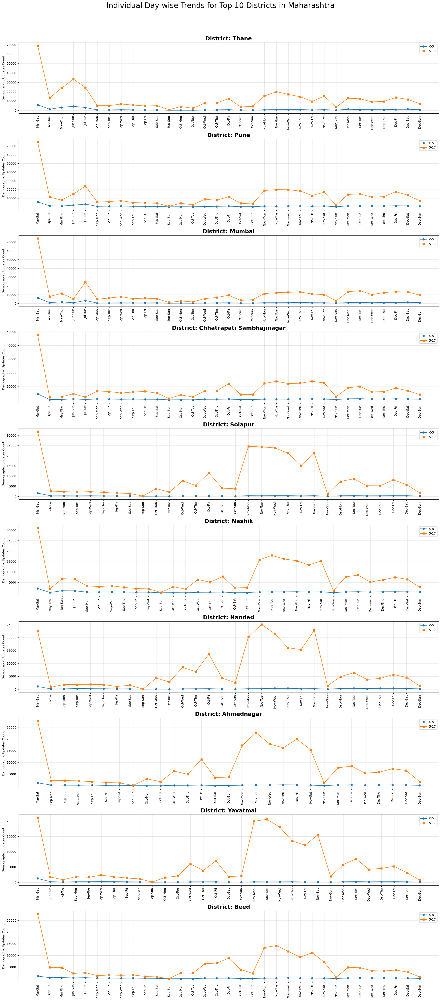

In [46]:
plot_state_district_day_trends("Maharashtra")

In [49]:
# Define Chronological Orders
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ["January", "February", "March", "April", "May", "June", 
               "July", "August", "September", "October", "November", "December"]

# Convert to ordered categorical for proper plotting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def generate_district_monthly_day_plots(state_name):
    # Filter for the state and find top 10 districts
    state_df = df[df['state'] == state_name]
    district_agg = state_df.groupby('district')['total_demographic_updates'].sum().reset_index()
    top_10_districts = district_agg.nlargest(10, 'total_demographic_updates')['district'].tolist()
    
    # Process each district individually
    for dist in top_10_districts:
        dist_df = state_df[state_df['district'] == dist]
        
        # Create a 4x3 grid for the 12 months
        fig, axes = plt.subplots(4, 3, figsize=(20, 20))
        fig.suptitle(f'12-Month Day-wise Analysis: {dist} ({state_name})', fontsize=26, fontweight='bold', y=1.03)
        axes = axes.flatten()
        
        for i, month in enumerate(month_order):
            ax = axes[i]
            
            # Filter and aggregate for this month
            month_data = dist_df[dist_df['month_name'] == month]
            day_data = month_data.groupby('day_of_week', observed=True)[["demo_age_17_", "demo_age_5_17"]].sum()
            
            # Ensure all 7 days are represented on the axis
            day_data_full = day_data.reindex(day_order).fillna(0).reset_index()
            
            # Plot age groups
            ax.plot(day_data_full['day_of_week'], day_data_full['demo_age_17_'], marker='o', label='0-5', color='#3498db', linewidth=2)
            ax.plot(day_data_full['day_of_week'], day_data_full['demo_age_5_17'], marker='s', label='5-17', color='#e67e22', linewidth=2)
            
            ax.set_title(month, fontsize=16, fontweight='bold')
            ax.tick_params(axis='x', rotation=45)
            ax.grid(True, alpha=0.3)
            if i == 0: ax.legend()
        
        plt.tight_layout()
        plt.savefig(f'analysis_{dist.replace(" ", "_")}.png', bbox_inches='tight')
        plt.show()


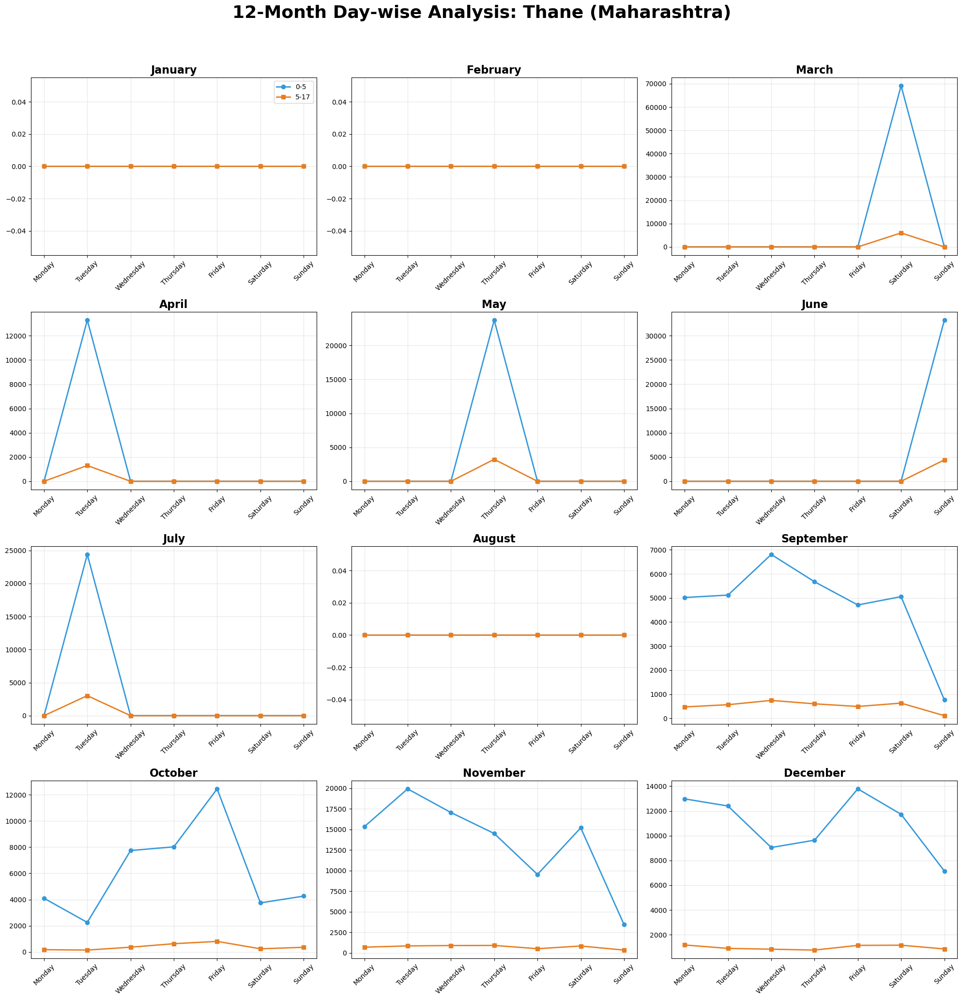

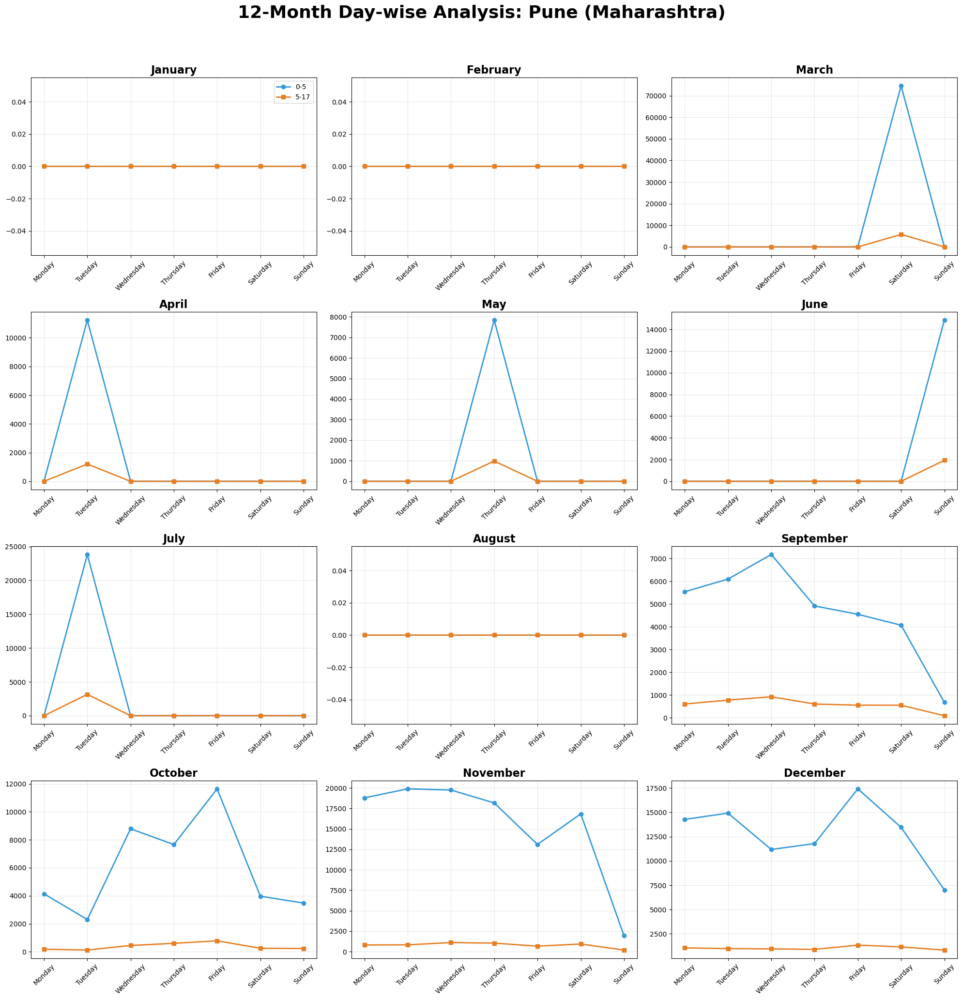

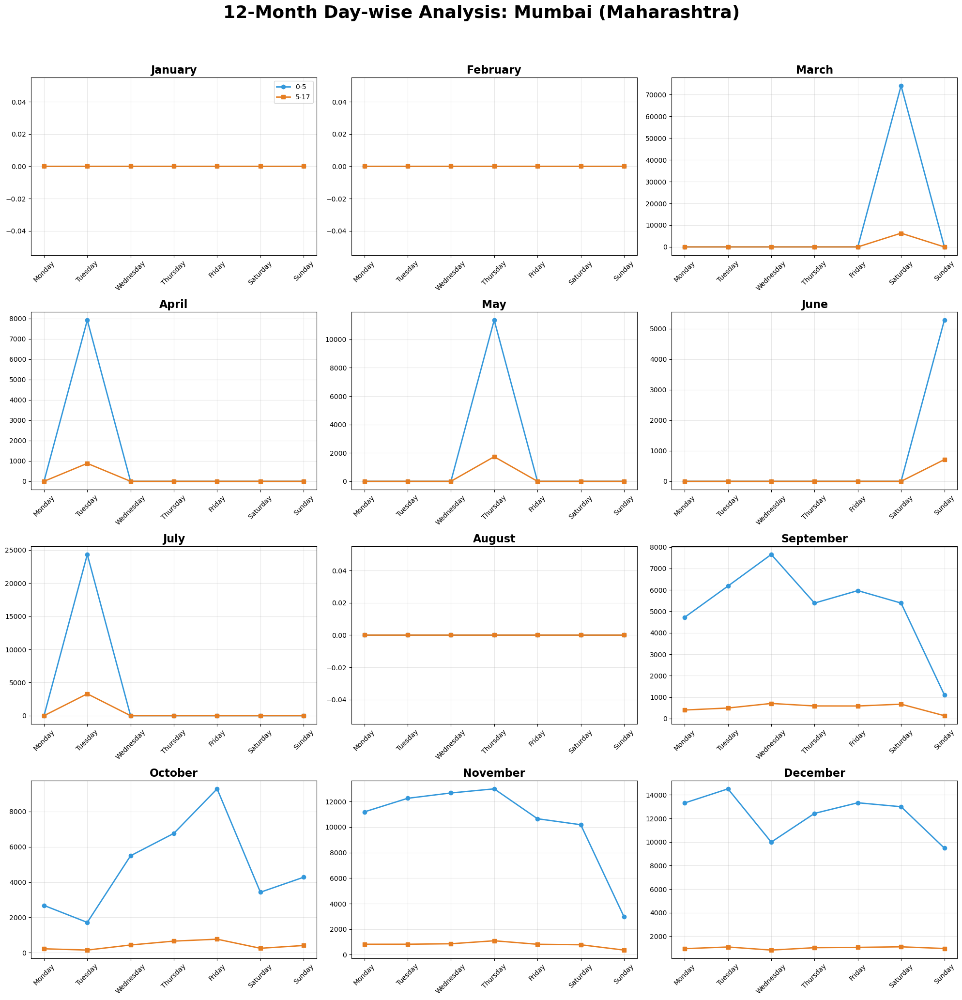

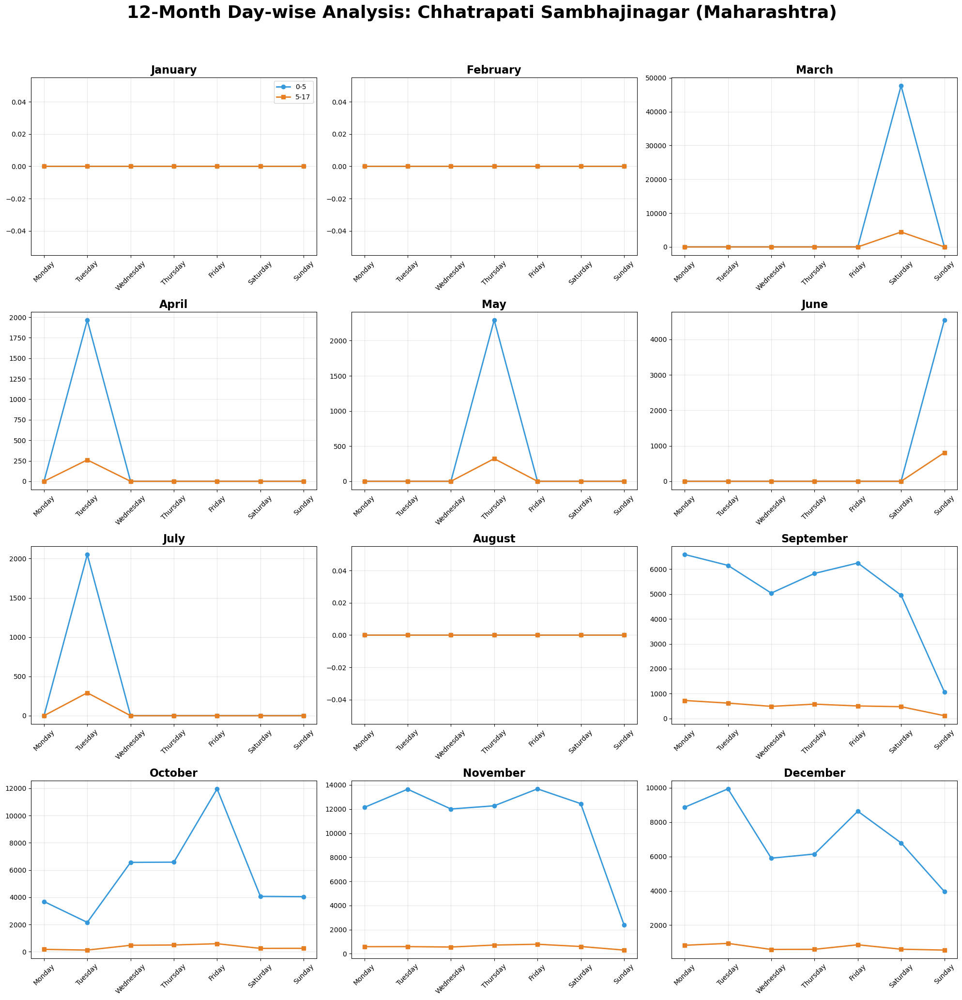

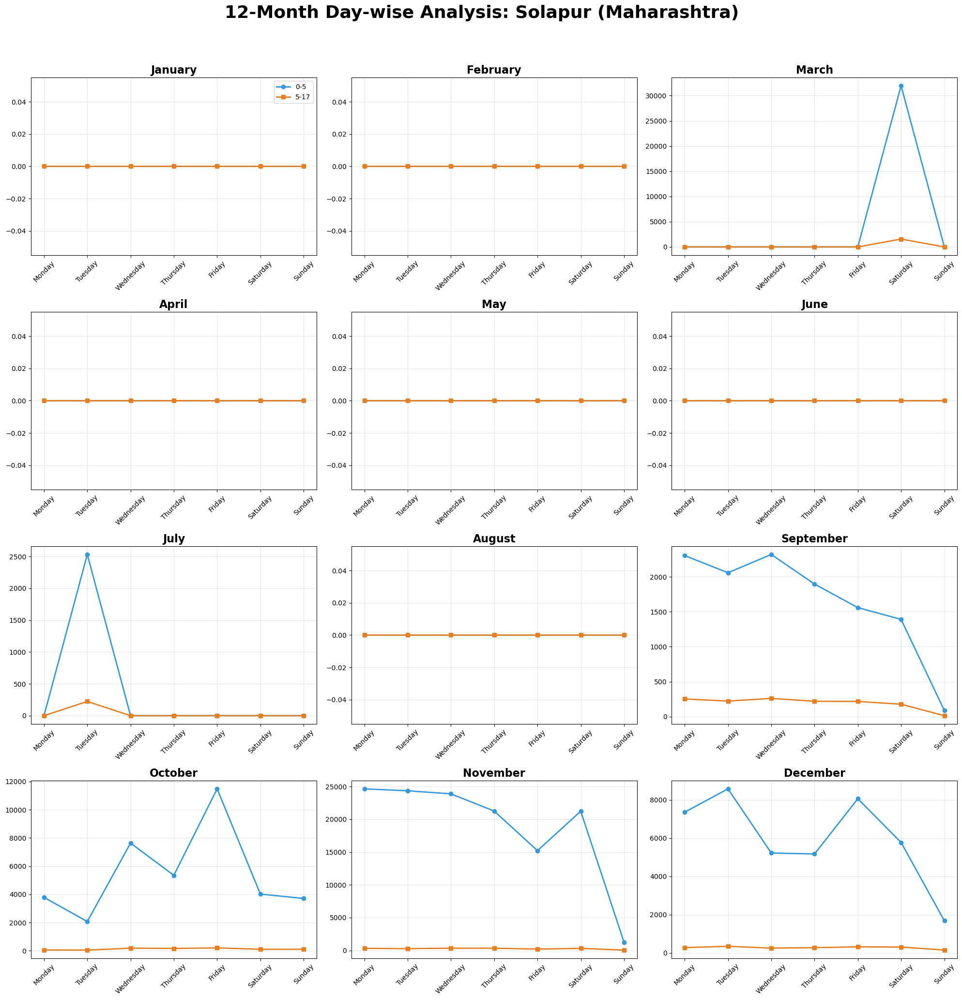

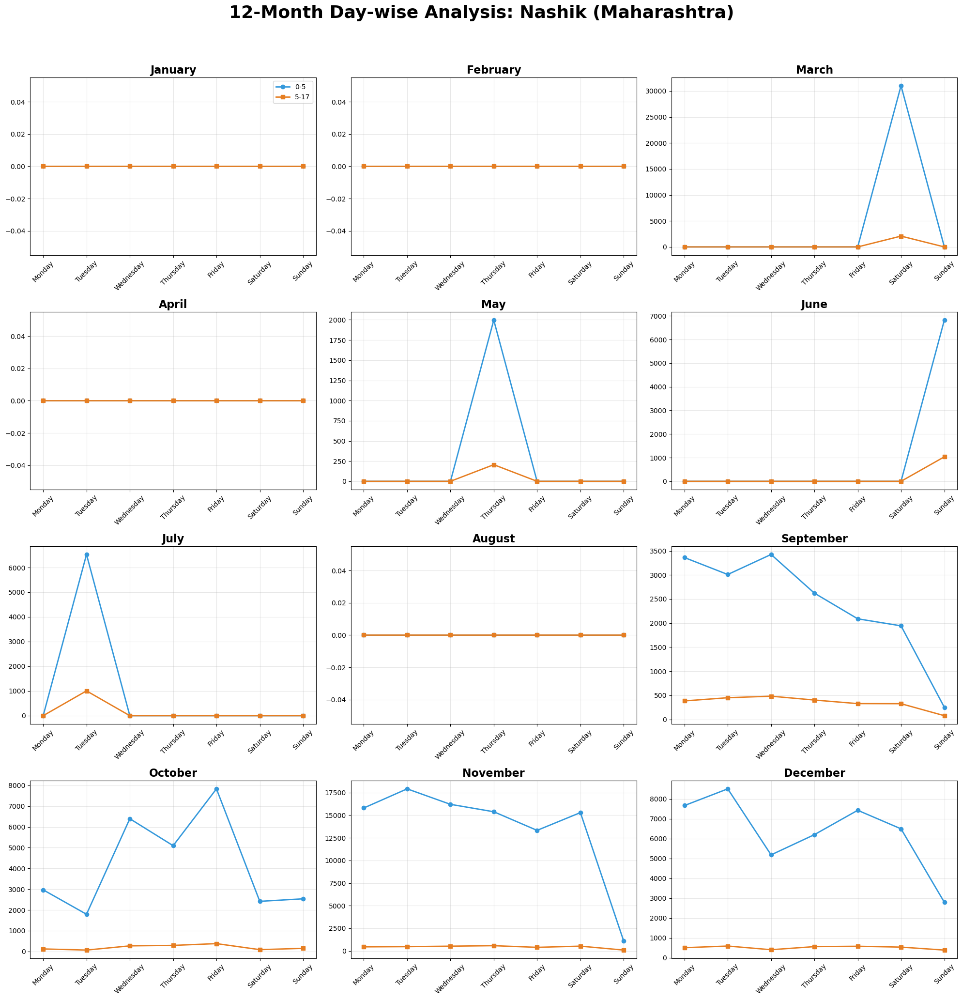

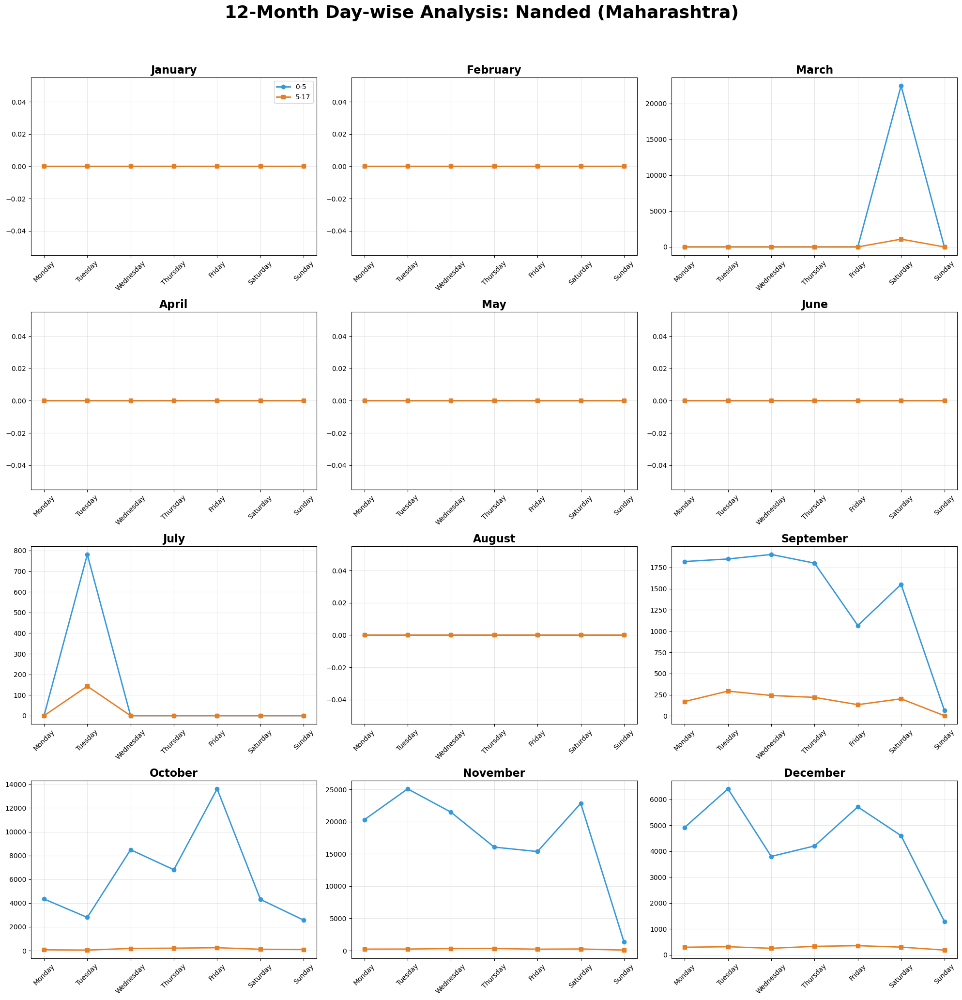

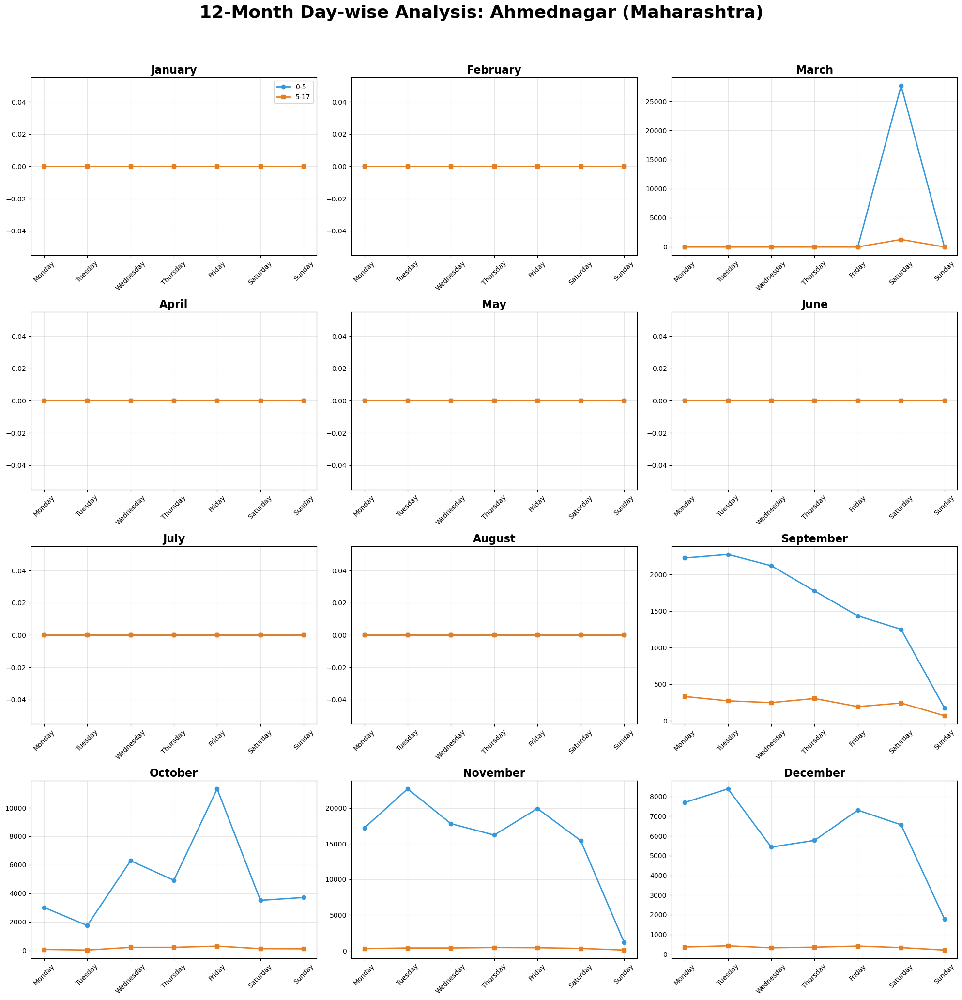

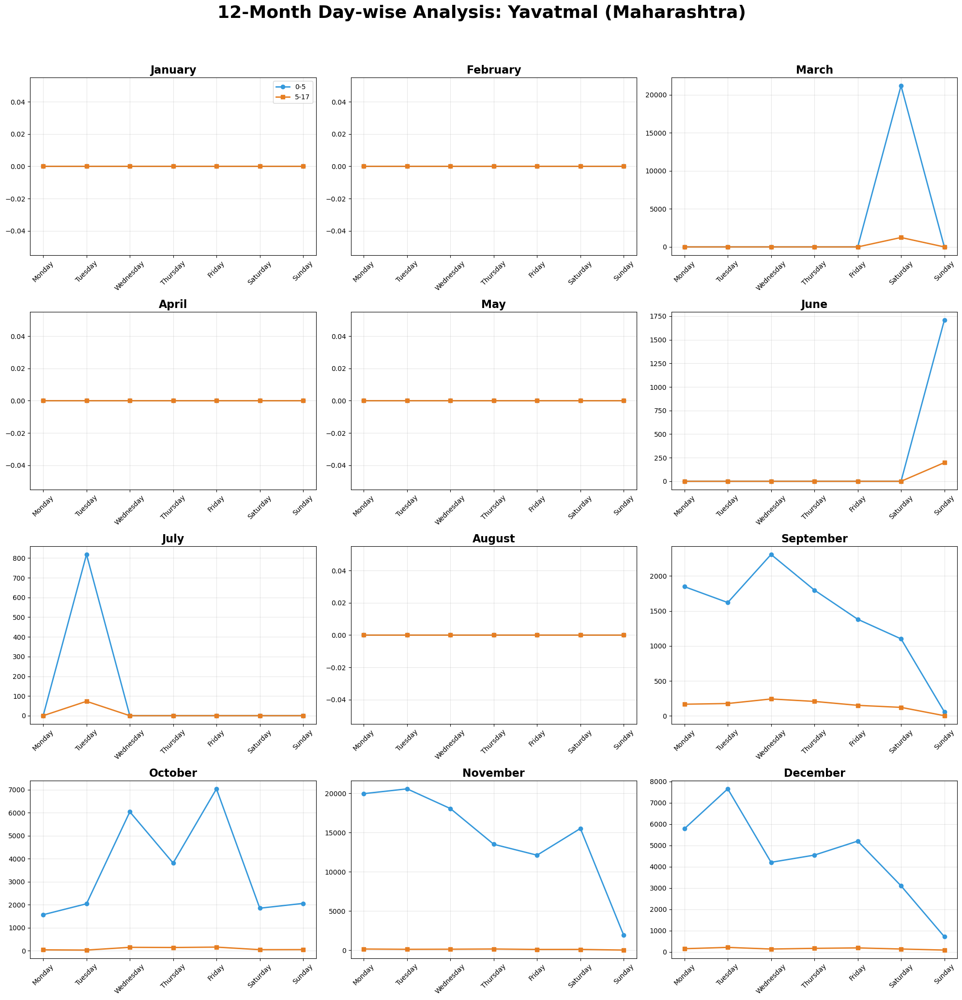

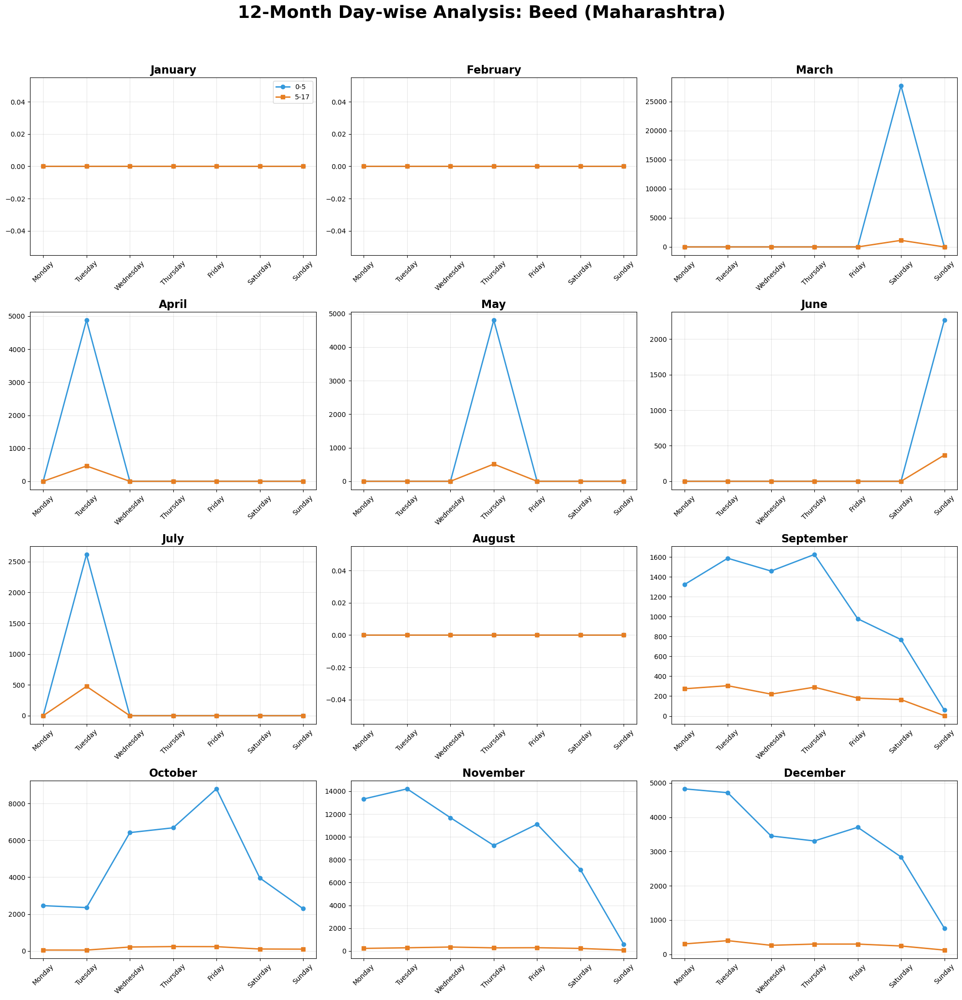

In [50]:
generate_district_monthly_day_plots("Maharashtra")

In [47]:
month_order = ["March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Convert to ordered categorical for proper sorting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def plot_state_district_bottom_day_trends(state_name):
    # 3. Total demographic updates for ranking
    df["total_demographic_updates"] = df["demo_age_5_17"] + df["demo_age_17_"]

    # 4. Select bottom 10 districts for the given state (using nsmallest)
    district_agg = df[df["state"] == state_name].groupby("district")["total_demographic_updates"].sum().reset_index()
    bottom_districts = district_agg.nsmallest(10, "total_demographic_updates")["district"].values
    # 5. Filter and Aggregate by District, Month, AND Day of Week
    df_filtered = df[(df["state"] == state_name) & (df["district"].isin(bottom_districts))].copy()
    
    agg = df_filtered.groupby(["district", "month_name", "day_of_week"], observed=True)[
        ["demo_age_5_17", "demo_age_17_"]
    ].sum().reset_index()

    # Sort to ensure continuous timeline (Chronological)
    agg = agg.sort_values(["district", "month_name", "day_of_week"])

    # Create descriptive X-axis labels (e.g., Sep-Mon)
    agg["label"] = agg["month_name"].astype(str).str[:3] + "-" + agg["day_of_week"].astype(str).str[:3]

    # 6. Plotting - Using 10 rows for detail
    fig, axes = plt.subplots(10, 1, figsize=(20, 45))
    fig.suptitle(f"Individual Day-wise Trends for Bottom 10 Districts in {state_name}", fontsize=24, y=1.0)
    
    for i, dist in enumerate(bottom_districts):
        data = agg[agg["district"] == dist]
        ax = axes[i]
        
        if not data.empty:
            ax.plot(data["label"], data["demo_age_5_17"], marker="o", label="0-5", linewidth=1.5)
            ax.plot(data["label"], data["demo_age_17_"], marker="s", label="5-17", linewidth=1.5)

            ax.set_title(f"District: {dist} (Bottom)", fontsize=18, fontweight='bold')
            ax.set_ylabel("Demographic Updates Count")
            ax.legend()
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='x', rotation=90)
        else:
            ax.text(0.5, 0.5, "No Data Available", transform=ax.transAxes, ha="center")
            ax.set_title(f"District: {dist} (Bottom)", fontsize=18, fontweight='bold')

    # Hide unused subplots if the state has fewer than 10 districts
    for j in range(len(bottom_districts), 10):
        axes[j].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


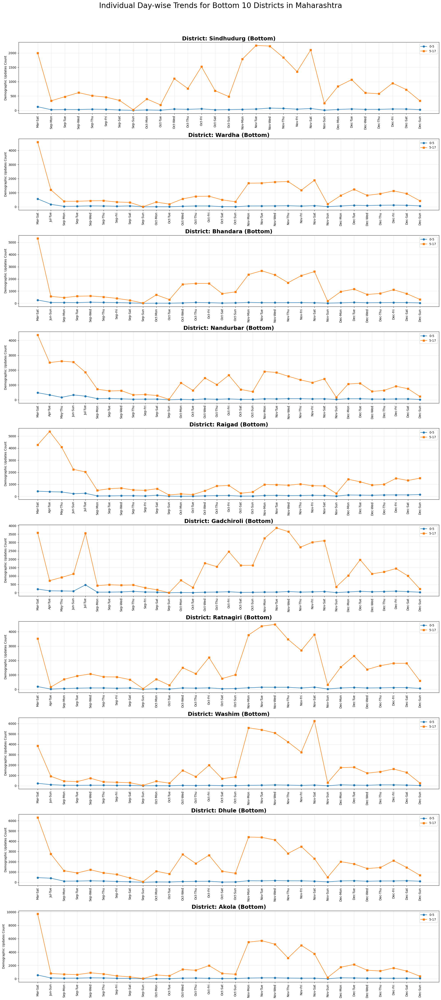

In [48]:
plot_state_district_bottom_day_trends("Maharashtra")

In [51]:
# Define Chronological Orders
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ["January", "February", "March", "April", "May", "June", 
               "July", "August", "September", "October", "November", "December"]

# Convert to ordered categorical for proper plotting
df["month_name"] = pd.Categorical(df["month_name"], categories=month_order, ordered=True)
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=day_order, ordered=True)

def generate_bottom_district_monthly_day_plots(state_name):
    # Filter for the state and find bottom 10 districts
    state_df = df[df['state'] == state_name]
    district_agg = state_df.groupby('district')['total_demographic_updates'].sum().reset_index()
    
    # Use nsmallest to get bottom 10 districts
    bottom_10_districts = district_agg.nsmallest(10, 'total_demographic_updates')['district'].tolist()
    
    # Process each district individually
    for dist in bottom_10_districts:
        dist_df = state_df[state_df['district'] == dist]
        
        # Create a 4x3 grid for the 12 months
        fig, axes = plt.subplots(4, 3, figsize=(20, 20))
        fig.suptitle(f'12-Month Day-wise Analysis (Bottom District): {dist} ({state_name})', 
                     fontsize=26, fontweight='bold', y=1.03)
        axes = axes.flatten()
        
        for i, month in enumerate(month_order):
            ax = axes[i]
            
            # Filter and aggregate for this month
            month_data = dist_df[dist_df['month_name'] == month]
            day_data = month_data.groupby('day_of_week', observed=True)[["demo_age_17_", "demo_age_5_17"]].sum()
            
            # Ensure all 7 days are represented on the axis
            day_data_full = day_data.reindex(day_order).fillna(0).reset_index()
            
            # Plot age groups
            ax.plot(day_data_full['day_of_week'], day_data_full['demo_age_17_'], marker='o', label='0-5', color='#3498db')
            ax.plot(day_data_full['day_of_week'], day_data_full['demo_age_5_17'], marker='s', label='5-17', color='#e67e22')
    

            ax.set_title(month, fontsize=16, fontweight='bold')
            ax.tick_params(axis='x', rotation=45)
            ax.grid(True, alpha=0.3)
            ax.set_ylim(bottom=0)
            if i == 0: ax.legend()
        
        plt.tight_layout()
        plt.savefig(f'bottom_analysis_{dist.replace(" ", "_")}.png', bbox_inches='tight')
        plt.show()


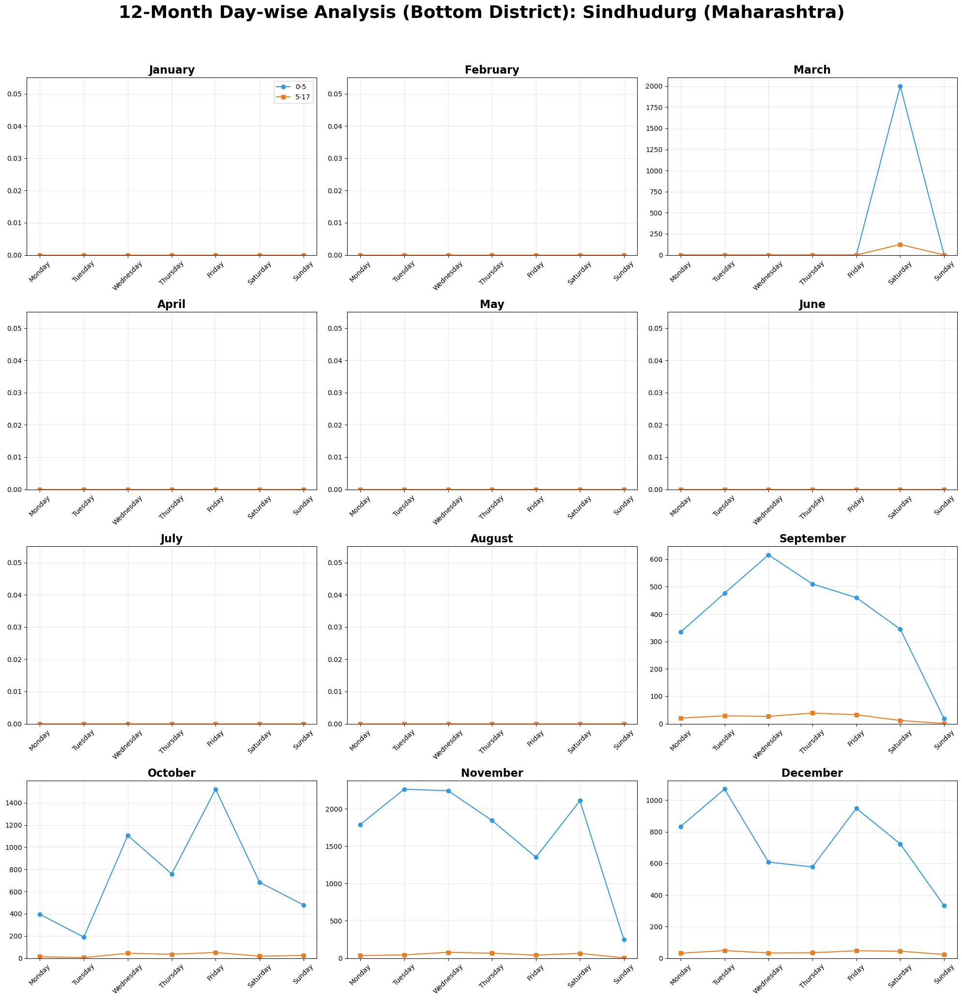

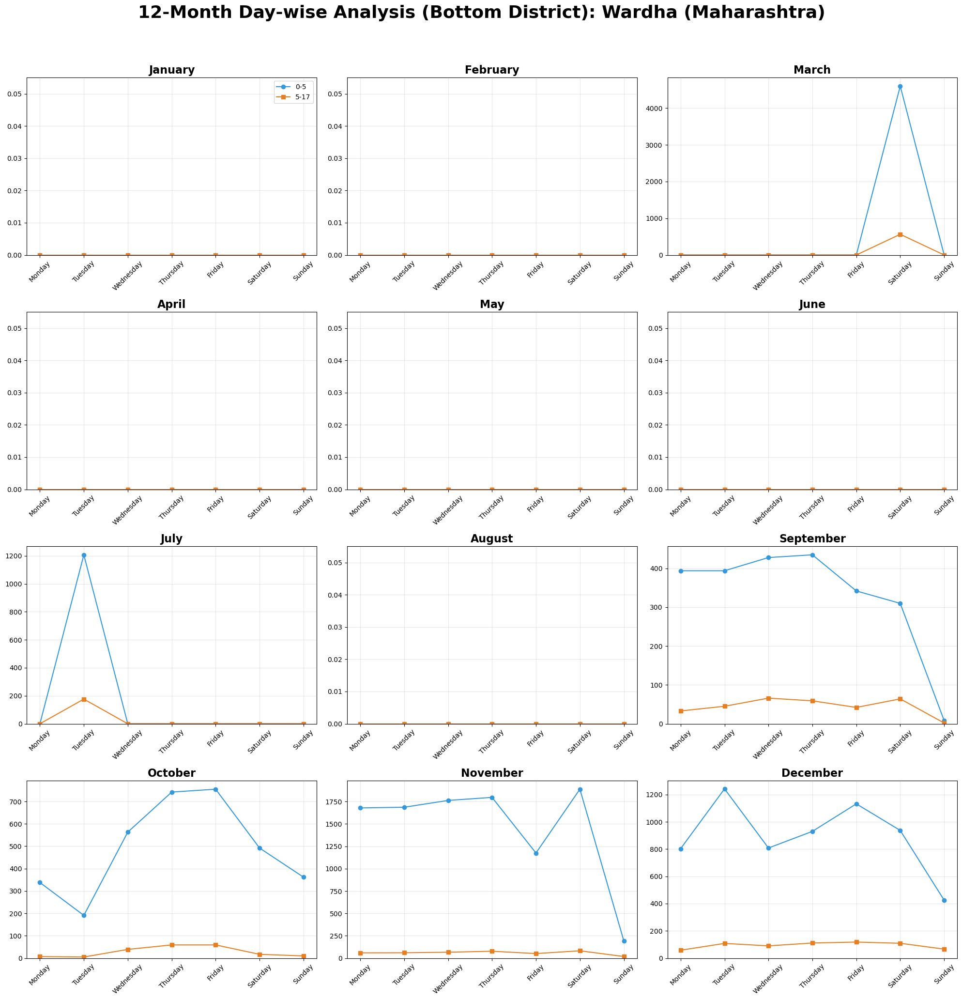

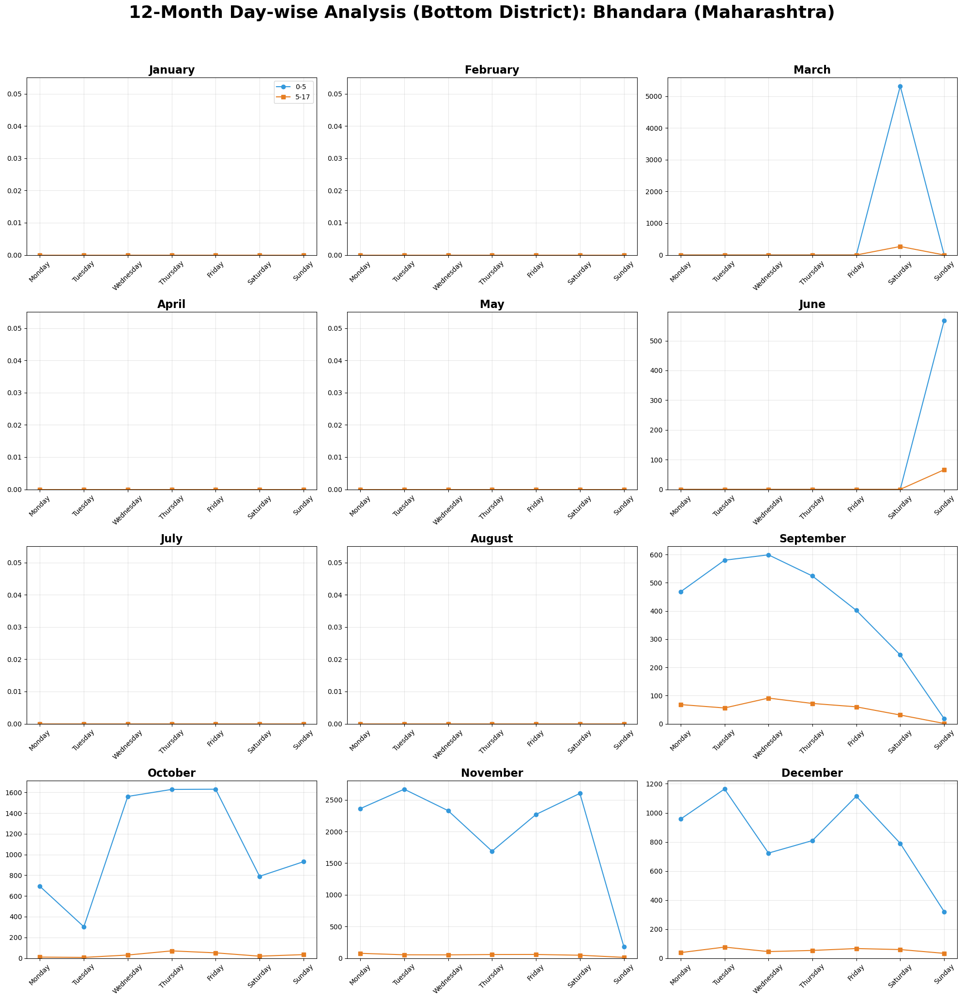

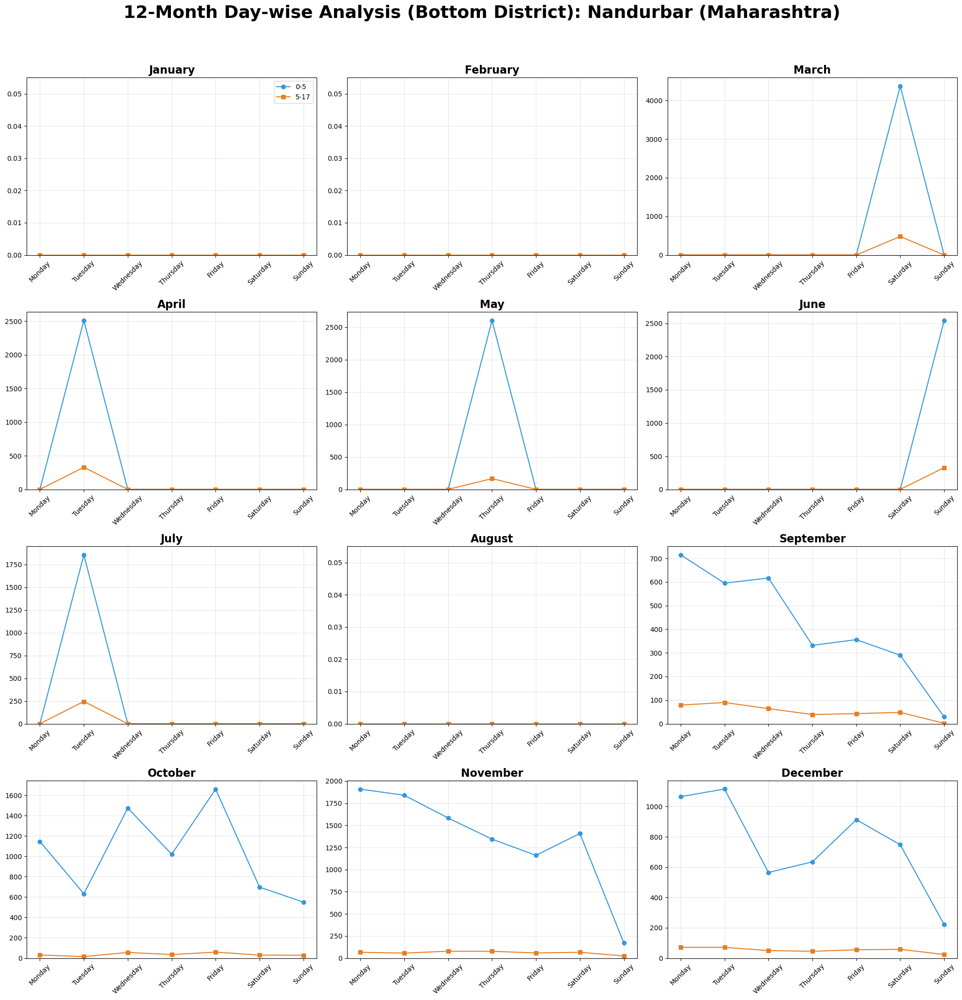

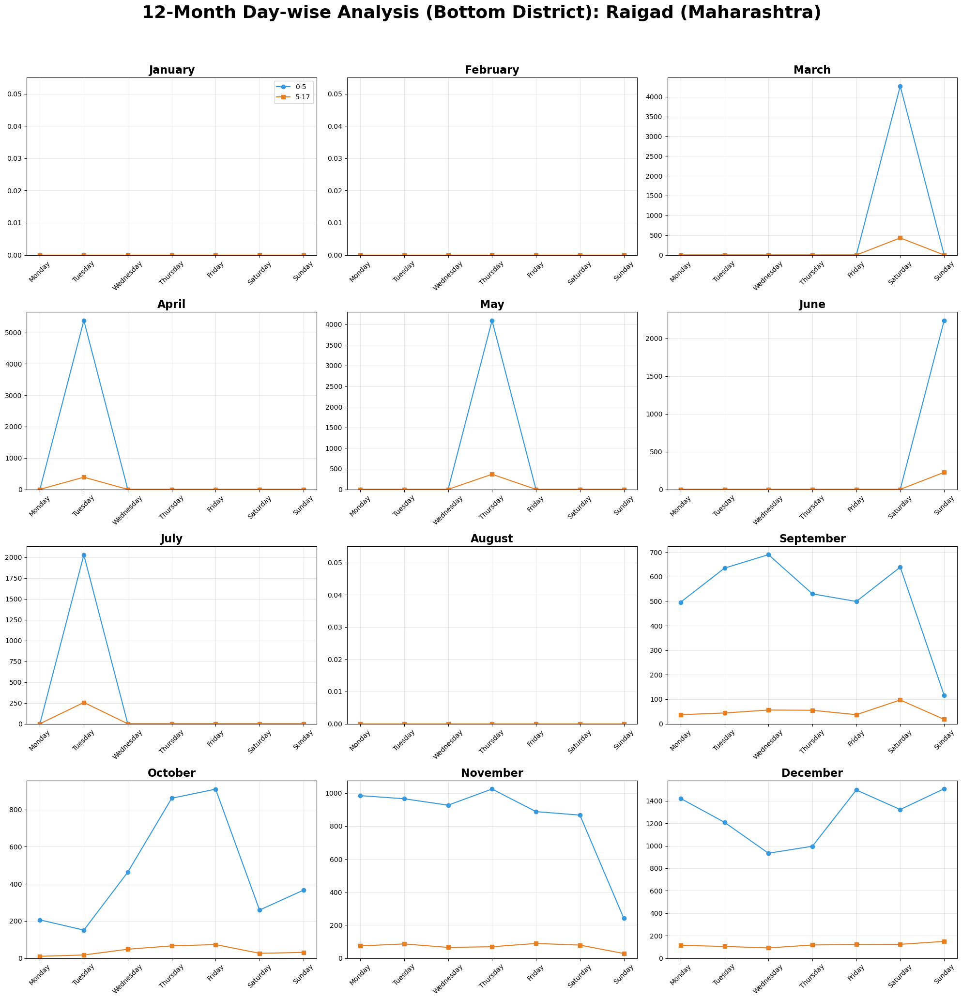

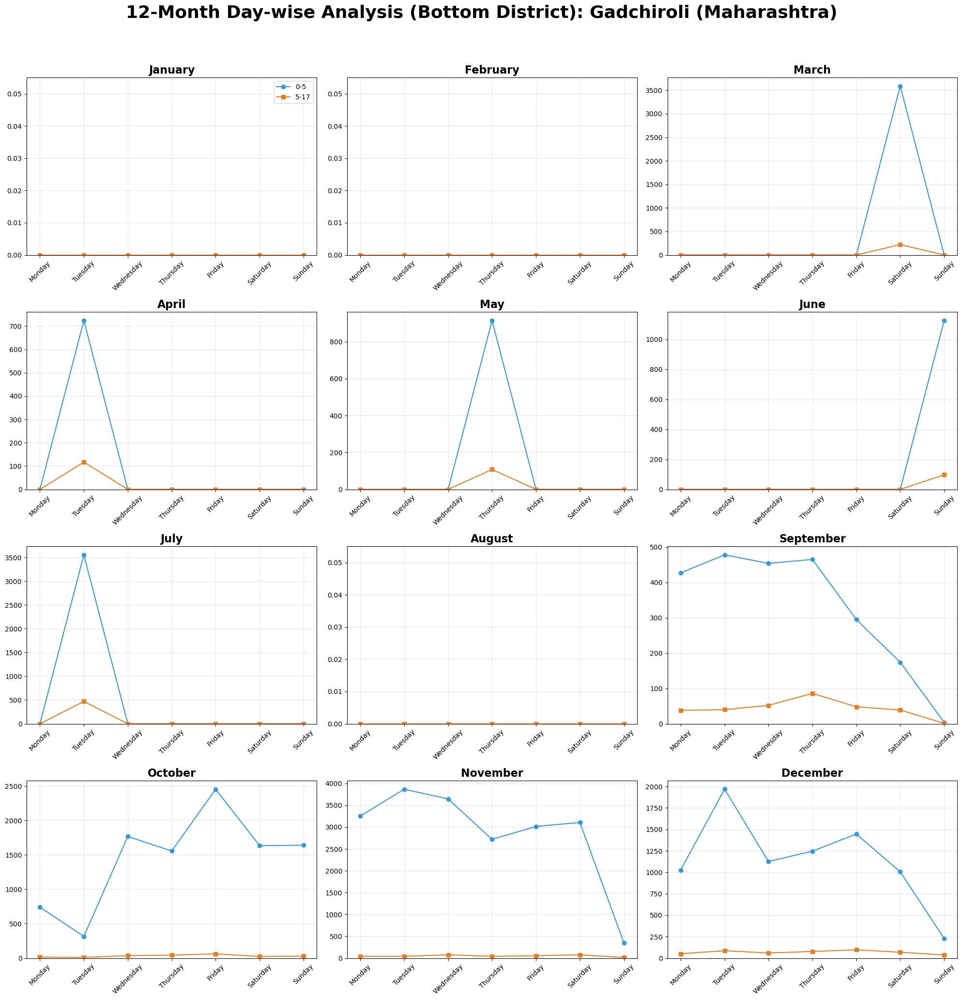

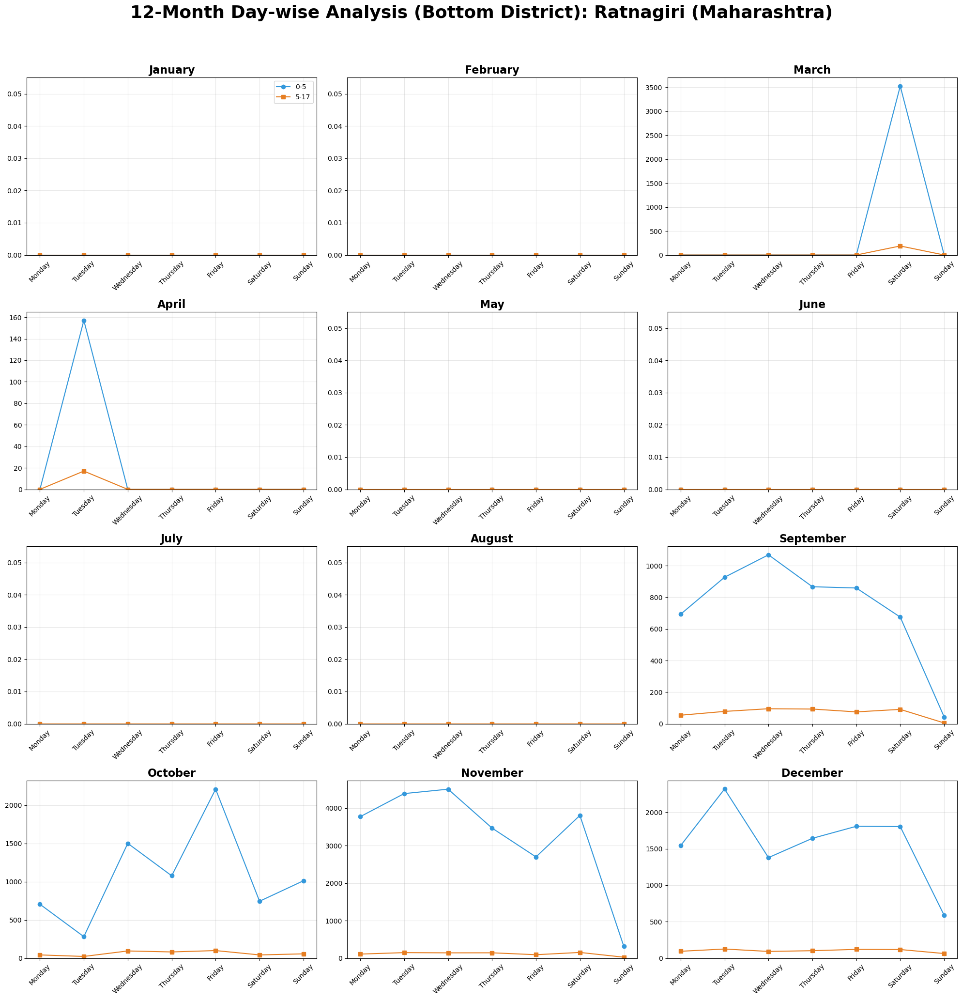

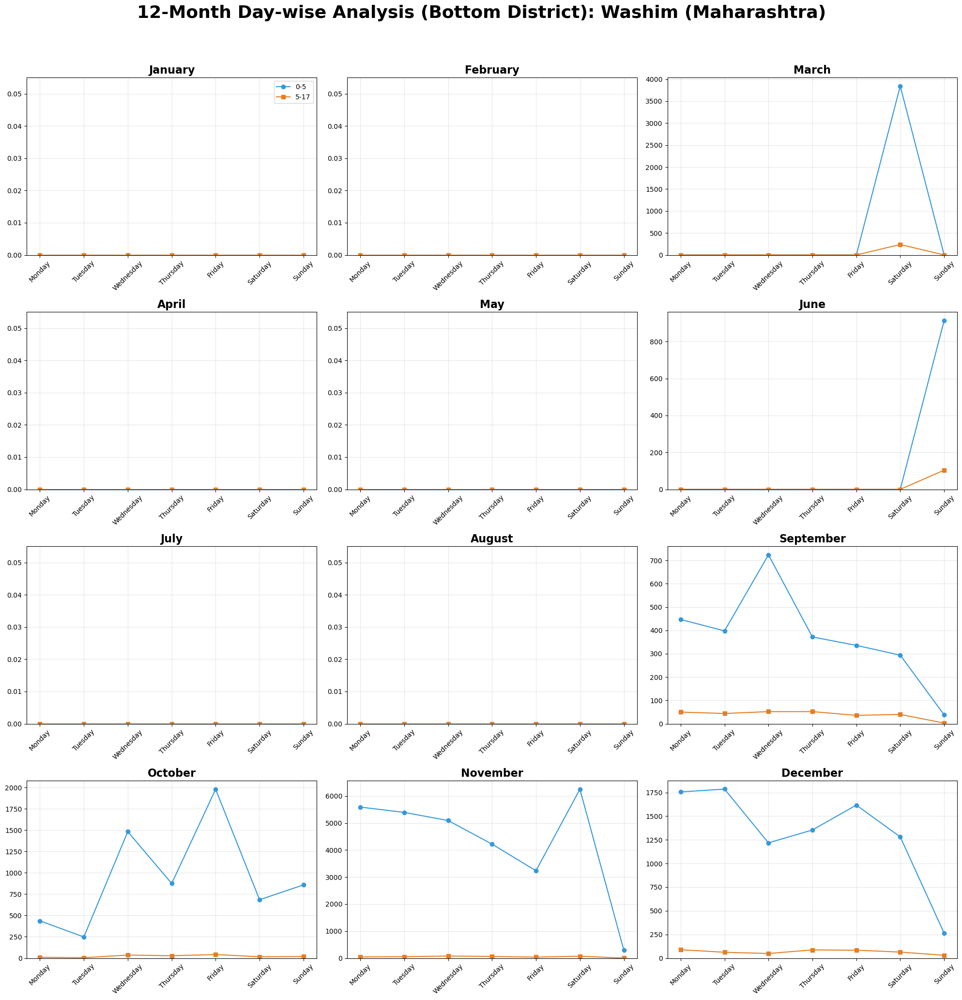

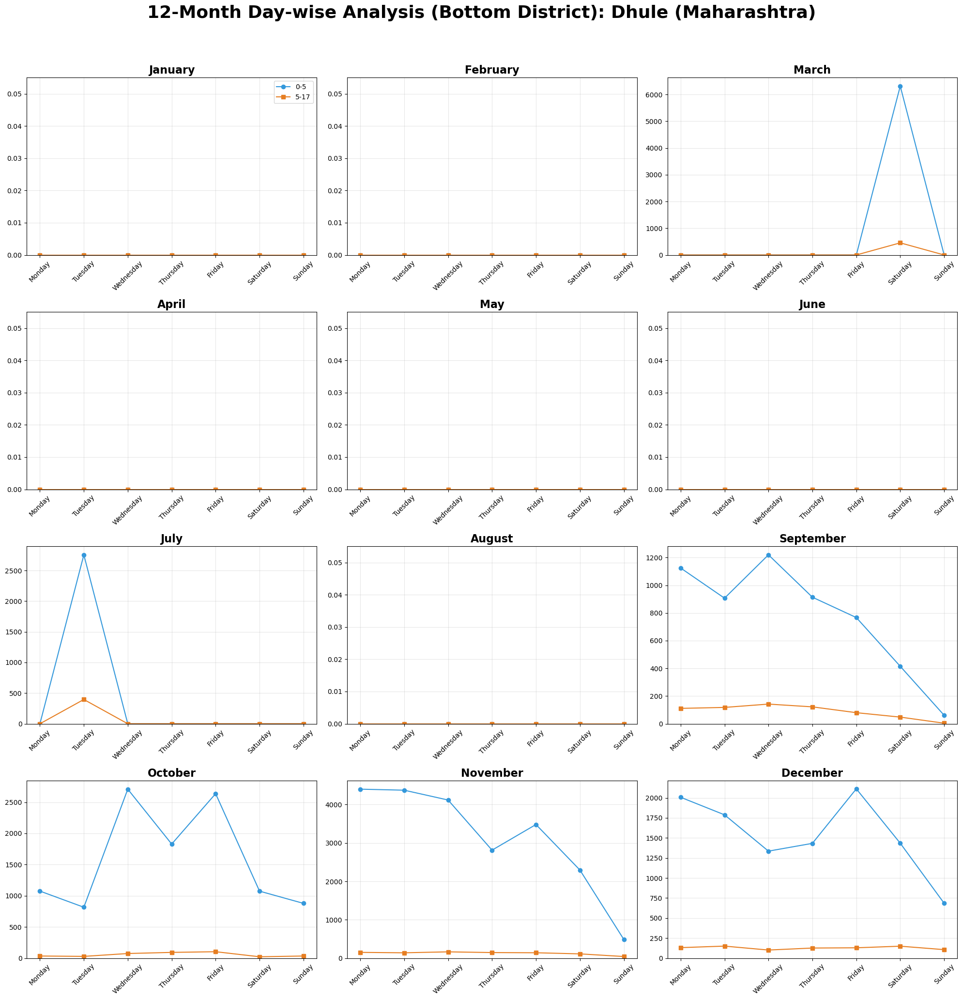

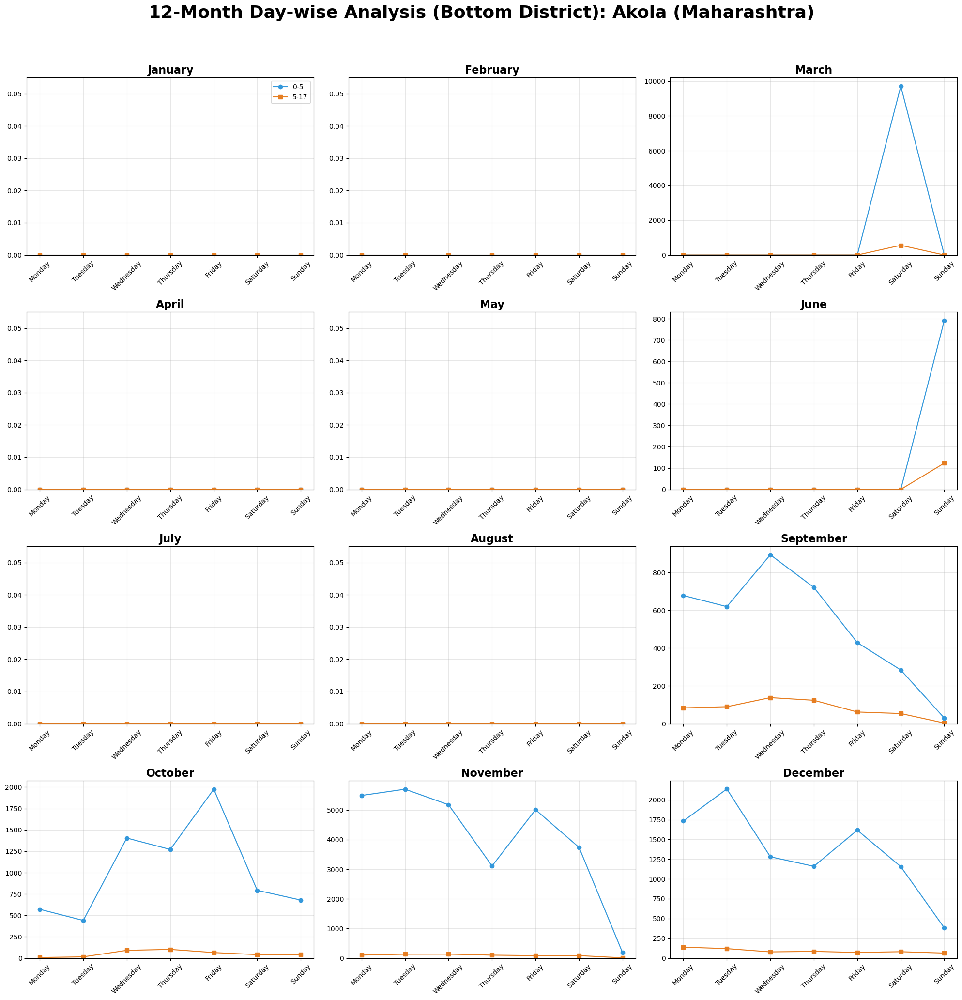

In [52]:
generate_bottom_district_monthly_day_plots("Maharashtra")